In [ ]:
X_stream = df[features]
y_stream = df['Label_encoded']
dates_stream = df['Date'].reset_index(drop=True)
n_total = len(df)
window_size = 20

# ARF+ADWIN
arf_adwin = forest.ARFClassifier(n_models=10, drift_detector=drift.ADWIN(), seed=42)
arf_adwin_pred = []

# ARF+ADWIN+Selective+Force Minor
arf_sel = forest.ARFClassifier(n_models=10, drift_detector=drift.ADWIN(), seed=42)
arf_sel_pred = []
adwin_sel = drift.ADWIN()
y_true_window_sel = deque(maxlen=window_size)
y_pred_window_sel = deque(maxlen=window_size)
selective_mode = True  # Flag for selective update
cooldown = 30  # Optional: cooldown after drift

# Simpan untuk F1-score & plotting
rf_pred = []
arf_adwin_pred = []
arf_sel_pred = []
all_true = []
adwin_drift_point = []  # For visualization

for i, (x, y) in tqdm(enumerate(stream.iter_pandas(X_stream, y_stream)), total=n_total, desc='Streaming Models'):
    # --- Static RF ---
    x_df = pd.DataFrame([x])
    y_pred_rf = rf_model.predict(x_df)[0]
    rf_pred.append(y_pred_rf)

    # --- ARF+ADWIN (Standard) ---
    y_pred_adwin = arf_adwin.predict_one(x)
    arf_adwin_pred.append(int(y_pred_adwin) if y_pred_adwin is not None else 0)
    arf_adwin.learn_one(x, y)

    # --- ARF+ADWIN+Selective+Force Minor ---
    y_pred_sel = arf_sel.predict_one(x)
    arf_sel_pred.append(int(y_pred_sel) if y_pred_sel is not None else 0)
    y_true_window_sel.append(y)
    y_pred_window_sel.append(y_pred_sel if y_pred_sel is not None else 0)
    all_true.append(int(y))

    # --- Update Selective (rolling F1 window) ---
    f1_before = None
    f1_after = None
    import copy
    if len(y_true_window_sel) == window_size:
        metric = metrics.F1()
        for yt, yp in zip(y_true_window_sel, y_pred_window_sel):
            metric.update(yt, yp)
        f1_before = metric.get()

        arf_temp = copy.deepcopy(arf_sel)
        arf_temp.learn_one(x, y)
        y_pred_temp = arf_temp.predict_one(x)
        temp_pred_window = deque(list(y_pred_window_sel), maxlen=window_size)
        temp_pred_window[-1] = y_pred_temp if y_pred_temp is not None else 0
        metric_temp = metrics.F1()
        for yt, yp in zip(y_true_window_sel, temp_pred_window):
            metric_temp.update(yt, yp)
        f1_after = metric_temp.get()

    # --- Drift Detection ---
    error = int(y_pred_sel != y) if y_pred_sel is not None else 1
    adwin_sel.update(error)
    if adwin_sel.drift_detected:
        selective_mode = False
        drift_count = cooldown  # Non-s elective for 'cooldown' steps
        adwin_drift_point.append(i)
    if not selective_mode:
        arf_sel.learn_one(x, y)
        drift_count -= 1
        if drift_count <= 0:
            selective_mode = True
    else:
        # Hybrid update
        if y != 0:
            arf_sel.learn_one(x, y)
        elif f1_before is None or f1_after is None or f1_after >= f1_before:
            arf_sel.learn_one(x, y)
    # else: skip update


Streaming Models:  85%|██████████████████████████████████████████████████▊         | 7007/8267 [07:34<00:49, 25.35it/s]

In [2]:
!pip install imblearn


Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [1]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from river import forest, drift, stream, metrics
from collections import deque
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE

# Load & prepare data (sudah Anda lakukan)
df = pd.read_csv('C:\\Users\\geose\\Downloads\\ml\\df.csv')
df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y')
features = ['VA', 'EVA', 'VB', 'EVB', 'LF', 'E', 'MP', 'EMP', 'ETOT', 'kumulatif']
df[features] = df[features].fillna(0)
df['Label_encoded'] = df['Label'].map({'Non': 0, 'Efusif': 1, 'Eksplosif': 2})

# Cutoff for static training
cutoff = pd.to_datetime("1999-12-31")
X_train = df[df['Date'] <= cutoff][features]
y_train = df[df['Date'] <= cutoff]['Label_encoded']

# 1. Train Static RF
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# 2. Train RF + SMOTE (tanpa mengganggu streaming loop)
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

rf_smote_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_smote_model.fit(X_train_smote, y_train_smote)


RandomForestClassifier(random_state=42)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from sklearn.metrics import f1_score, classification_report

# Inisialisasi model dan buffer
rf_smote_retrain_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_smote_retrain_model.fit(X_train_smote, y_train_smote)

rf_retrain_buffer_X = []
rf_retrain_buffer_y = []
rf_smote_retrain_pred = []
y_true = []

retrain_interval = 500  # atau sesuaikan sendiri

# Streaming dan retraining loop
for i, row in df_stream.iterrows():
    x = row[features].values.reshape(1, -1)
    y = row['Label_encoded']

    y_pred = rf_smote_retrain_model.predict(x)[0]
    rf_smote_retrain_pred.append(y_pred)
    y_true.append(y)

    rf_retrain_buffer_X.append(row[features].values)
    rf_retrain_buffer_y.append(y)

    if (i + 1) % retrain_interval == 0:
        X_batch = pd.DataFrame(rf_retrain_buffer_X, columns=features)
        y_batch = pd.Series(rf_retrain_buffer_y)
        X_resampled, y_resampled = SMOTE(random_state=42).fit_resample(X_batch, y_batch)
        rf_smote_retrain_model.fit(X_resampled, y_resampled)
        rf_retrain_buffer_X.clear()
        rf_retrain_buffer_y.clear()

# Evaluasi
print("F1-score macro:", f1_score(y_true, rf_smote_retrain_pred, average='macro'))
print(classification_report(y_true, rf_smote_retrain_pred))


C:\Users\geose\anaconda3\envs\rivera\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\geose\anaconda3\envs\rivera\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\geose\anaconda3\envs\rivera\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\geose\anaconda3\envs\rivera\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\geose\anaconda3\envs\rivera\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score
from collections import deque, Counter
from tqdm import tqdm
import random

from river import forest, metrics, stream, drift
X_stream = df[features]                  # start from index 0
y_stream = df['Label_encoded']
dates_stream = df['Date'].reset_index(drop=True)
n_total = len(df)   

# Init ARF
arf_sel = forest.ARFClassifier(n_models=10, drift_detector=drift.ADWIN(), seed=42)
arf_adwin = forest.ARFClassifier(n_models=10, drift_detector=drift.ADWIN(), seed=42)
adwin_sel = drift.ADWIN()

arf_sel_pred, arf_adwin_pred = [], []
rf_pred, rf_smote_pred, all_true = [], [], []
minority_buffer = deque(maxlen=30)
y_window = deque(maxlen=100)

def closest_pair(buffer):
    X = [list(x.values()) for x in buffer]
    dists = [((i, j), np.linalg.norm(np.array(X[i]) - np.array(X[j])))
             for i in range(len(X)) for j in range(i + 1, len(X))]
    if not dists:
        return buffer[0], buffer[0]
    (i, j), _ = min(dists, key=lambda x: x[1])
    return buffer[i], buffer[j]

# Start streaming loop for each instance in the data stream
for i, (x, y) in tqdm(enumerate(stream.iter_pandas(X_stream, y_stream)), total=n_total):

    # Convert instance x to a DataFrame to allow static RF prediction
    x_df = pd.DataFrame([x])

    # === STATIC BASELINE PREDICTIONS ===
    # Predict using a static Random Forest trained up to cutoff (1999)
    rf_pred.append(rf_model.predict(x_df)[0])

    # Predict using a static RF model trained with SMOTE-balanced data
    rf_smote_pred.append(rf_smote_model.predict(x_df)[0])

    # === ADAPTIVE RANDOM FOREST WITH ADWIN ===
    # Predict class using ARF with ADWIN drift detector (no oversampling)
    y_pred_adwin = arf_adwin.predict_one(x)
    y_pred_adwin = int(y_pred_adwin) if y_pred_adwin is not None else 0
    arf_adwin_pred.append(y_pred_adwin)

    # Update ARF+ADWIN model with the true label
    arf_adwin.learn_one(x, y)

    # === ARF IV.A: CONFIDENCE-AWARE + ONLINE SMOTE ===
    # Predict class using ARF IV.A (selective oversampling + drift response)
    y_pred_sel = arf_sel.predict_one(x)
    y_pred_sel = int(y_pred_sel) if y_pred_sel is not None else 0
    arf_sel_pred.append(y_pred_sel)
    all_true.append(y)

    # Maintain a sliding window of true labels to identify the minority class dynamically
    y_window.append(y)
    if len(y_window) < y_window.maxlen:
        # Allow initial learning before confidence-aware logic activates
        arf_sel.learn_one(x, y)
        continue

    # Determine the current minority class from recent labels in the window
    y_counts = Counter(y_window)
    minority_class = min(y_counts, key=y_counts.get)

    # Train ARF IV.A model on the actual input instance
    arf_sel.learn_one(x, y)

    # === CONFIDENCE-AWARE SYNTHETIC OVERSAMPLING ===
    # Retrieve the class probability distribution (confidence scores)
    proba = arf_sel.predict_proba_one(x)
    conf = proba.get(y, 0)  # Confidence in the correct class

    # Only proceed if the instance belongs to the minority class AND the model lacks confidence
    if y == minority_class and conf < 0.8 and i % 10 == 0:

        # Add the instance to a memory buffer for the minority class
        minority_buffer.append(x)

        # Generate a synthetic sample only when at least two buffer elements are available
        if len(minority_buffer) >= 2:
            # Select the closest pair based on Euclidean distance
            x1, x2 = closest_pair(minority_buffer)

            # Interpolate between x1 and x2 to create a synthetic instance, with minor noise
            synthetic_sample = {
                k: (x1[k] + x2[k]) / 2 + random.gauss(0, 0.01)
                for k in x1
            }

            # Inject the synthetic sample into the ARF IV.A learner
            arf_sel.learn_one(synthetic_sample, y)

    # === DRIFT-AWARE LIGHT RETRAINING ===
    # Update drift detector based on prediction error
    error = int(y_pred_sel != y)
    if adwin_sel.update(error) and adwin_sel.drift_detected:
        # Upon drift detection, retrain model lightly using synthetic minority samples
        for s in random.sample(list(minority_buffer), min(5, len(minority_buffer))):
            arf_sel.learn_one(s, minority_class)

  8%|██████                                                                         | 634/8267 [00:08<01:41, 74.91it/s]


KeyboardInterrupt: 

In [12]:
from collections import deque, Counter
import random
from river import tree, forest, drift, stream
from tqdm import tqdm
import pandas as pd
import numpy as np

# === Inisialisasi model ===
arf_adwin = forest.ARFClassifier(n_models=10, drift_detector=drift.ADWIN(), seed=42)
arf_sel = forest.ARFClassifier(n_models=10, drift_detector=drift.ADWIN(), seed=42)
adwin_sel = drift.ADWIN()

ht_adwin = tree.HoeffdingTreeClassifier()
ht_sel = tree.HoeffdingTreeClassifier()
adwin_ht = drift.ADWIN()
adwin_ht_iv = drift.ADWIN()

# === Buffer dan Window ===
minority_buffer = deque(maxlen=30)
minority_buffer_ht = deque(maxlen=30)
y_window = deque(maxlen=100)
y_window_ht = deque(maxlen=100)

# === Hasil prediksi ===
arf_adwin_pred, arf_sel_pred = [], []
ht_adwin_pred, ht_sel_pred = [], []
rf_pred, rf_smote_pred, all_true = [], [], []

# === Loop streaming ===
for i, (x, y) in tqdm(enumerate(stream.iter_pandas(X_stream, y_stream)), total=n_total):

    # Convert to DataFrame for static RF
    x_df = pd.DataFrame([x])
    rf_pred.append(rf_model.predict(x_df)[0])
    rf_smote_pred.append(rf_smote_model.predict(x_df)[0])

    # === ARF + ADWIN ===
    y_pred_adwin = arf_adwin.predict_one(x)
    y_pred_adwin = int(y_pred_adwin) if y_pred_adwin is not None else 0
    arf_adwin_pred.append(y_pred_adwin)
    arf_adwin.learn_one(x, y)

    # === ARF + IV.A ===
    y_pred_sel = arf_sel.predict_one(x)
    y_pred_sel = int(y_pred_sel) if y_pred_sel is not None else 0
    arf_sel_pred.append(y_pred_sel)
    all_true.append(y)

    y_window.append(y)
    if len(y_window) < y_window.maxlen:
        arf_sel.learn_one(x, y)
    else:
        minority_class = min(Counter(y_window), key=Counter(y_window).get)
        arf_sel.learn_one(x, y)
        proba = arf_sel.predict_proba_one(x)
        conf = proba.get(y, 0)
        if y == minority_class and conf < 0.8 and i % 10 == 0:
            minority_buffer.append(x)
            if len(minority_buffer) >= 2:
                x1, x2 = closest_pair(minority_buffer)
                synthetic_sample = {k: (x1[k] + x2[k]) / 2 + random.gauss(0, 0.01) for k in x1}
                arf_sel.learn_one(synthetic_sample, y)
        if adwin_sel.update(int(y_pred_sel != y)) and adwin_sel.drift_detected:
            for s in random.sample(list(minority_buffer), min(5, len(minority_buffer))):
                arf_sel.learn_one(s, minority_class)

    # === HT + ADWIN ===
    y_pred_ht = ht_adwin.predict_one(x)
    y_pred_ht = int(y_pred_ht) if y_pred_ht is not None else 0
    ht_adwin_pred.append(y_pred_ht)
    ht_adwin.learn_one(x, y)
    if adwin_ht.update(int(y_pred_ht != y)) and adwin_ht.drift_detected:
        ht_adwin = tree.HoeffdingTreeClassifier()

    # === HT + IV.A ===
    y_pred_ht_iv = ht_sel.predict_one(x)
    y_pred_ht_iv = int(y_pred_ht_iv) if y_pred_ht_iv is not None else 0
    ht_sel_pred.append(y_pred_ht_iv)

    y_window_ht.append(y)
    if len(y_window_ht) < y_window_ht.maxlen:
        ht_sel.learn_one(x, y)
    else:
        minority_class_ht = min(Counter(y_window_ht), key=Counter(y_window_ht).get)
        ht_sel.learn_one(x, y)
        proba_ht = ht_sel.predict_proba_one(x)
        conf_ht = proba_ht.get(y, 0)
        if y == minority_class_ht and conf_ht < 0.8 and i % 10 == 0:
            minority_buffer_ht.append(x)
            if len(minority_buffer_ht) >= 2:
                x1, x2 = closest_pair(minority_buffer_ht)
                synthetic_sample_ht = {k: (x1[k] + x2[k]) / 2 + random.gauss(0, 0.01) for k in x1}
                ht_sel.learn_one(synthetic_sample_ht, y)
        if adwin_ht_iv.update(int(y_pred_ht_iv != y)) and adwin_ht_iv.drift_detected:
            for s in random.sample(list(minority_buffer_ht), min(5, len(minority_buffer_ht))):
                ht_sel.learn_one(s, minority_class_ht)


100%|██████████████████████████████████████████████████████████████████████████████| 8267/8267 [01:50<00:00, 75.15it/s]


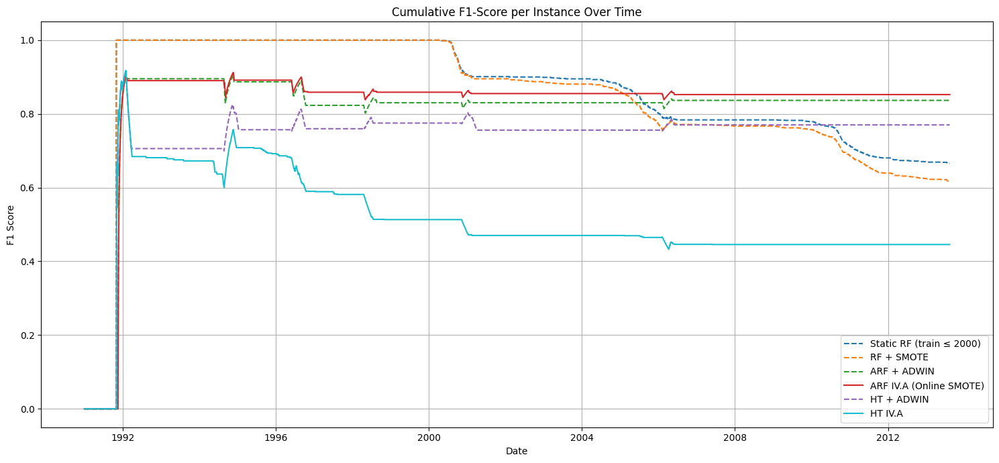

In [22]:
def cumulative_f1(y_true_list, y_pred_list):
    f1_scores = []
    f1_metric = metrics.F1()
    for yt, yp in zip(y_true_list, y_pred_list):
        f1_metric.update(yt, yp)
        f1_scores.append(f1_metric.get())
    return f1_scores

# Hitung semua cumulative F1
cum_f1_rf = cumulative_f1(all_true, rf_pred)
cum_f1_rf_smote = cumulative_f1(all_true, rf_smote_pred)
cum_f1_arf_adwin = cumulative_f1(all_true, arf_adwin_pred)
cum_f1_arf_iva = cumulative_f1(all_true, arf_sel_pred)
cum_f1_ht_adwin = cumulative_f1(all_true, ht_adwin_pred)
cum_f1_ht_iva = cumulative_f1(all_true, ht_sel_pred)

plt.figure(figsize=(15, 7))
# Memplot garis untuk setiap model.
# Sumbu X adalah tanggal (dates_stream) dan sumbu Y adalah F1-score kumulatif.
plt.plot(dates_stream, cum_f1_rf, label='Static RF (train ≤ 2000)', linestyle='--', color=color_rf)           # Model Random Forest statis
plt.plot(dates_stream, cum_f1_rf_smote, label='RF + SMOTE', linestyle='--', color=color_rf_smote)            # Model RF dengan SMOTE
plt.plot(dates_stream, cum_f1_arf_adwin, label='ARF + ADWIN', linestyle='--', color=color_arf_adwin)         # Model ARF dengan detektor drift ADWIN
plt.plot(dates_stream, cum_f1_arf_iva, label='ARF IV.A (Online SMOTE)', linestyle='-', color=color_arf_iva)  # Model ARF dengan oversampling online (garis solid)
plt.plot(dates_stream, cum_f1_ht_adwin, label='HT + ADWIN', linestyle='--', color=color_ht_adwin)            # Model Hoeffding Tree dengan ADWIN
plt.plot(dates_stream, cum_f1_ht_iva, label='HT IV.A', linestyle='-', color=color_ht_iva)                    # Model HT dengan oversampling online (garis solid)


plt.legend()
plt.grid(True)
plt.title("Cumulative F1-Score per Instance Over Time")
plt.xlabel("Date")
plt.ylabel("F1 Score")
plt.tight_layout()
plt.show()

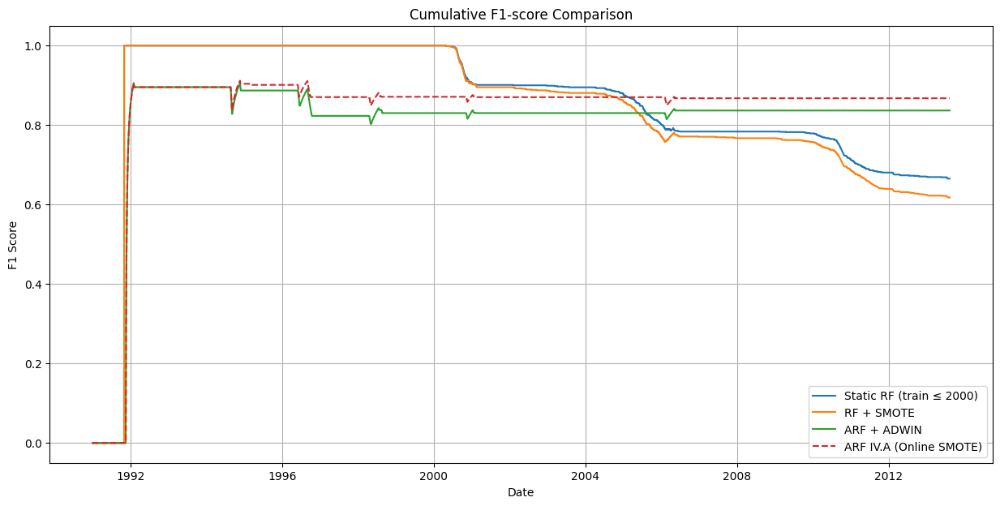

In [68]:
def cumulative_f1(y_true_list, y_pred_list):
    f1_scores = []
    metric = metrics.F1()
    for yt, yp in zip(y_true_list, y_pred_list):
        metric.update(yt, yp)
        f1_scores.append(metric.get())
    return f1_scores

f1_rf = cumulative_f1(all_true, rf_pred)
f1_adwin = cumulative_f1(all_true, arf_adwin_pred)
f1_smote = cumulative_f1(all_true, arf_sel_pred)

plt.figure(figsize=(15, 7))
plt.plot(dates_stream, cum_f1_rf, label='Static RF (train ≤ 2000)')
plt.plot(dates_stream, cum_f1_rf_smote, label='RF + SMOTE')
plt.plot(dates_stream, cum_f1_adwin, label='ARF + ADWIN')
plt.plot(dates_stream, cum_f1_iva, label='ARF IV.A (Online SMOTE)', linestyle='--')

plt.legend()
plt.title("Cumulative F1-score Comparison")
plt.xlabel("Date")
plt.ylabel("F1 Score")
plt.grid(True)
plt.show()


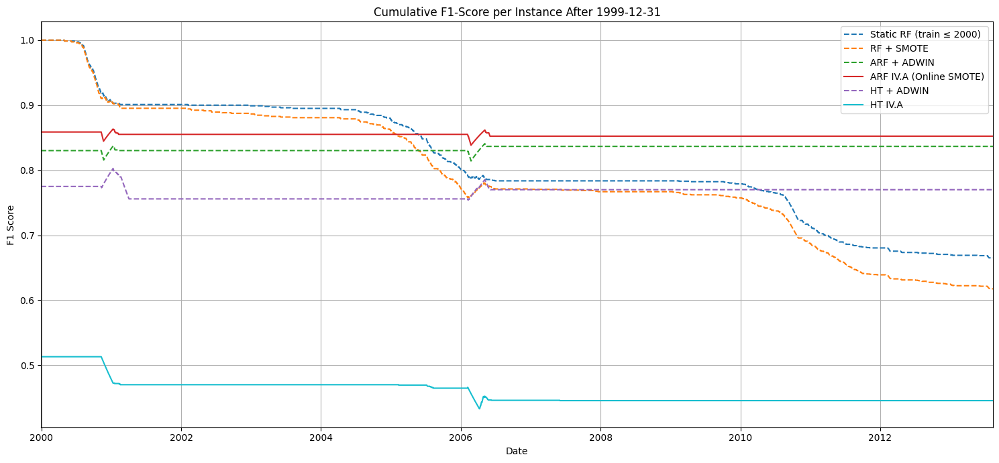

In [20]:
import datetime

# Definisikan tanggal batas bawah
threshold_date = datetime.datetime.strptime('1999-12-31', '%Y-%m-%d')

# Temukan index pertama yang memenuhi syarat
start_index = next(i for i, date in enumerate(dates_stream) if date >= threshold_date)

# Potong semua data dari index tersebut
dates_cut = dates_stream[start_index:]
cum_f1_rf_cut = cum_f1_rf[start_index:]
cum_f1_rf_smote_cut = cum_f1_rf_smote[start_index:]
cum_f1_arf_adwin_cut = cum_f1_arf_adwin[start_index:]
cum_f1_arf_iva_cut = cum_f1_arf_iva[start_index:]
cum_f1_ht_adwin_cut = cum_f1_ht_adwin[start_index:]
cum_f1_ht_iva_cut = cum_f1_ht_iva[start_index:]

# Definisikan warna untuk tiap model
color_rf = '#1f77b4'           # blue
color_rf_smote = '#ff7f0e'     # orange
color_arf_adwin = '#2ca02c'    # green
color_arf_iva = '#d62728'      # red
color_ht_adwin = '#9467bd'     # purple
color_ht_iva = '#17becf'       # cyan

# Plot
plt.figure(figsize=(15, 7))

plt.plot(dates_cut, cum_f1_rf_cut, label='Static RF (train ≤ 2000)', linestyle='--', color=color_rf)
plt.plot(dates_cut, cum_f1_rf_smote_cut, label='RF + SMOTE', linestyle='--', color=color_rf_smote)
plt.plot(dates_cut, cum_f1_arf_adwin_cut, label='ARF + ADWIN', linestyle='--', color=color_arf_adwin)
plt.plot(dates_cut, cum_f1_arf_iva_cut, label='ARF IV.A (Online SMOTE)', linestyle='-', color=color_arf_iva)
plt.plot(dates_cut, cum_f1_ht_adwin_cut, label='HT + ADWIN', linestyle='--', color=color_ht_adwin)
plt.plot(dates_cut, cum_f1_ht_iva_cut, label='HT IV.A', linestyle='-', color=color_ht_iva)

plt.legend()
plt.grid(True)
plt.title("Cumulative F1-Score per Instance After 1999-12-31")
plt.xlabel("Date")
plt.ylabel("F1 Score")
plt.xlim([threshold_date, max(dates_stream)])
plt.tight_layout()
plt.show()


Rolling F1 (window=100): 100%|████████████████████████████████████████████████████| 8167/8167 [00:09<00:00, 899.90it/s]


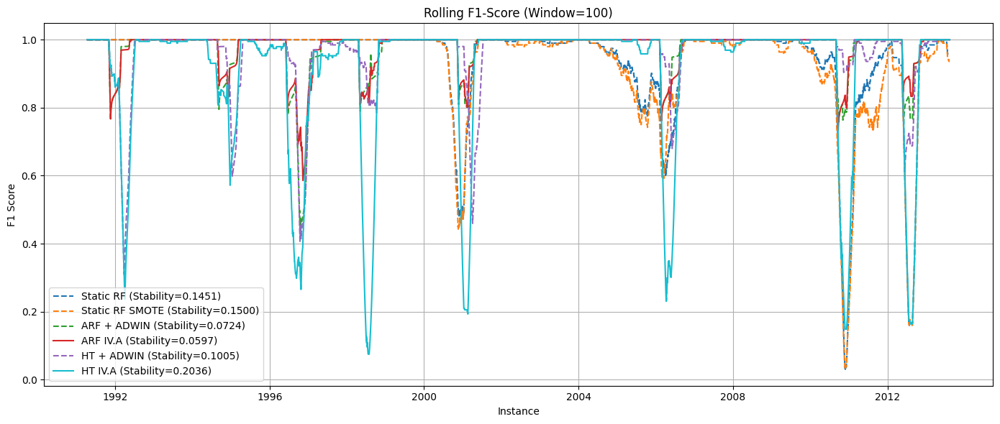

Rolling F1 (window=100): 100%|████████████████████████████████████████████████████| 4881/4881 [00:07<00:00, 678.53it/s]


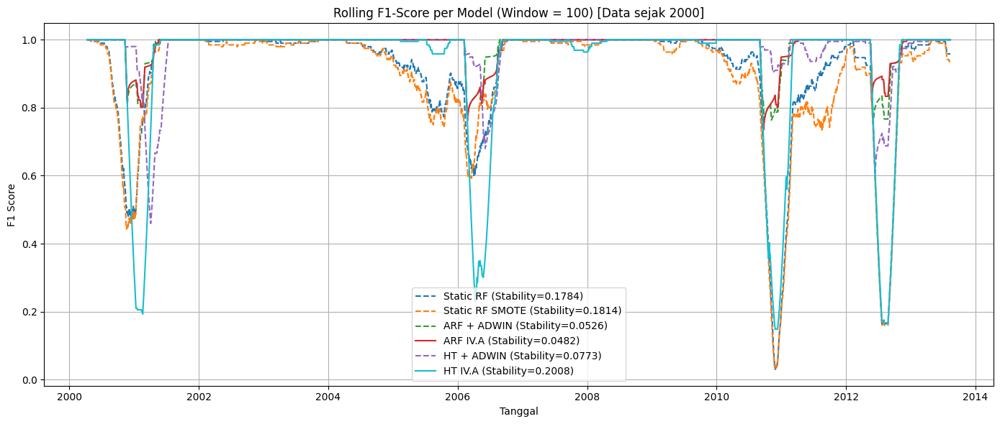

In [24]:
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm import tqdm  # Progress bar

# ==== STEP 1: Siapkan DataFrame dan Filter dari Tahun 2000 ====
df_eval = pd.DataFrame({
    'Date': pd.to_datetime(dates_stream),
    'True': all_true,
    'RF': rf_pred,
    'RF_SMOTE': rf_smote_pred,
    'ARF_ADWIN': arf_adwin_pred,
    'ARF_IV.A': arf_sel_pred,
    'HT_ADWIN': ht_adwin_pred,
    'HT_IV.A': ht_sel_pred
})

# Filter hanya data dari tahun 2000 ke atas
df_eval = df_eval[df_eval['Date'].dt.year >= 2000].reset_index(drop=True)

# Update variabel untuk evaluasi
dates_stream = df_eval['Date']
all_true = df_eval['True']
rf_pred = df_eval['RF']
rf_smote_pred = df_eval['RF_SMOTE']
arf_adwin_pred = df_eval['ARF_ADWIN']
arf_sel_pred = df_eval['ARF_IV.A']
ht_adwin_pred = df_eval['HT_ADWIN']
ht_sel_pred = df_eval['HT_IV.A']

# ==== STEP 2: Definisikan Fungsi Rolling F1 ====
def rolling_f1(y_true, y_pred, window=100):
    scores = [None] * window  # padding awal
    for i in tqdm(range(window, len(y_true)), desc=f"Rolling F1 (window={window})"):
        score = f1_score(y_true[i-window:i], y_pred[i-window:i], average='weighted', zero_division=0)
        scores.append(score)
    return scores

# ==== STEP 3: Hitung Rolling F1 per Model ====
roll_f1_rf = rolling_f1(all_true, rf_pred, window=100)
roll_f1_rf_smote = rolling_f1(all_true, rf_smote_pred, window=100)
roll_f1_arf_adwin = rolling_f1(all_true, arf_adwin_pred, window=100)
roll_f1_arf_iva = rolling_f1(all_true, arf_sel_pred, window=100)
roll_f1_ht_adwin = rolling_f1(all_true, ht_adwin_pred, window=100)
roll_f1_ht_iva = rolling_f1(all_true, ht_sel_pred, window=100)

# ==== STEP 4: Hitung Stabilitas (Standar Deviasi Rolling F1) ====
stability_rf = np.nanstd([x for x in roll_f1_rf if x is not None])
stability_rf_smote = np.nanstd([x for x in roll_f1_rf_smote if x is not None])
stability_arf_adwin = np.nanstd([x for x in roll_f1_arf_adwin if x is not None])
stability_arf_iva = np.nanstd([x for x in roll_f1_arf_iva if x is not None])
stability_ht_adwin = np.nanstd([x for x in roll_f1_ht_adwin if x is not None])
stability_ht_iva = np.nanstd([x for x in roll_f1_ht_iva if x is not None])

# ==== STEP 5: Plot Rolling F1 Score ====
# Tentukan warna untuk masing-masing model (ganti sesuai preferensi)
# Definisikan warna yang kontras dan tidak menggunakan brown
color_rf = '#1f77b4'           # blue
color_rf_smote = '#ff7f0e'     # orange
color_arf_adwin = '#2ca02c'    # green
color_arf_iva = '#d62728'      # red (ARF IV.A)
color_ht_adwin = '#9467bd'     # purple
color_ht_iva = '#17becf'       # cyan/teal 

plt.figure(figsize=(14, 6))
plt.plot(dates_stream, roll_f1_rf, label=f'Static RF (Stability={stability_rf:.4f})', linestyle='--', color=color_rf)
plt.plot(dates_stream, roll_f1_rf_smote, label=f'Static RF SMOTE (Stability={stability_rf_smote:.4f})', linestyle='--', color=color_rf_smote)
plt.plot(dates_stream, roll_f1_arf_adwin, label=f'ARF + ADWIN (Stability={stability_arf_adwin:.4f})', linestyle='--', color=color_arf_adwin)
plt.plot(dates_stream, roll_f1_arf_iva, label=f'ARF IV.A (Stability={stability_arf_iva:.4f})', linestyle='-', color=color_arf_iva)
plt.plot(dates_stream, roll_f1_ht_adwin, label=f'HT + ADWIN (Stability={stability_ht_adwin:.4f})', linestyle='--', color=color_ht_adwin)
plt.plot(dates_stream, roll_f1_ht_iva, label=f'HT IV.A (Stability={stability_ht_iva:.4f})', linestyle='-', color=color_ht_iva)

plt.title('Rolling F1-Score per Model (Window = 100) [Data sejak 2000]')
plt.xlabel('Tanggal')
plt.ylabel('F1 Score')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


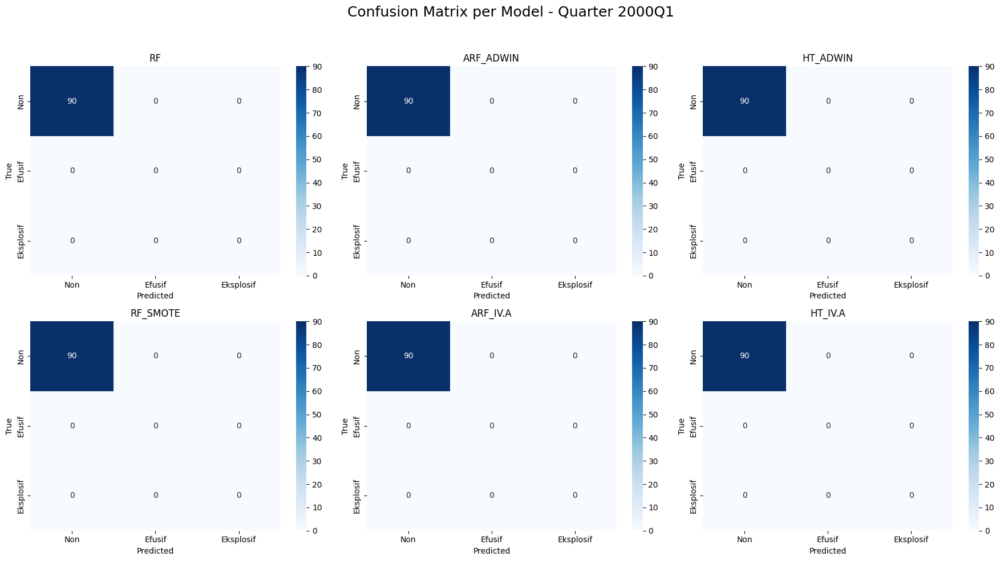

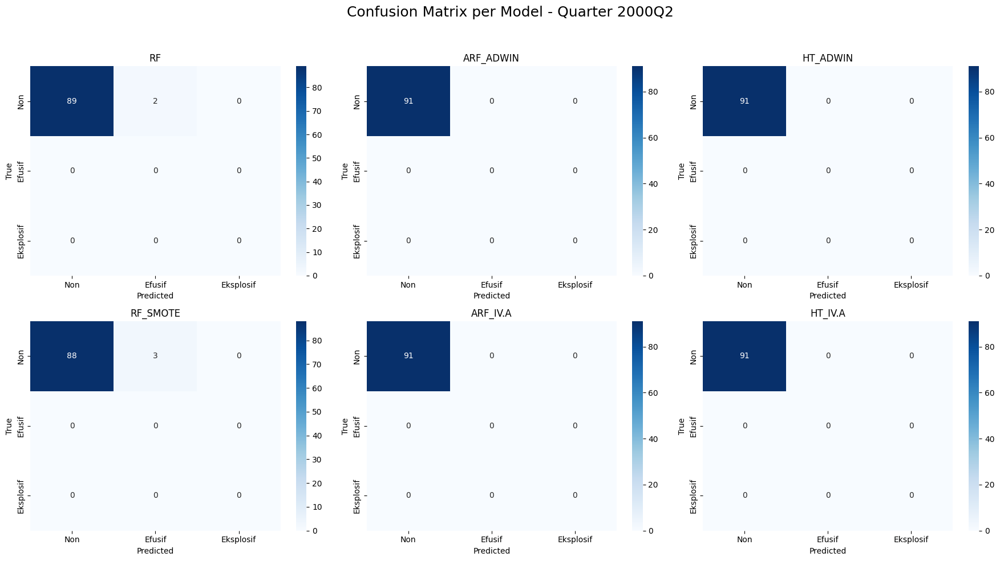

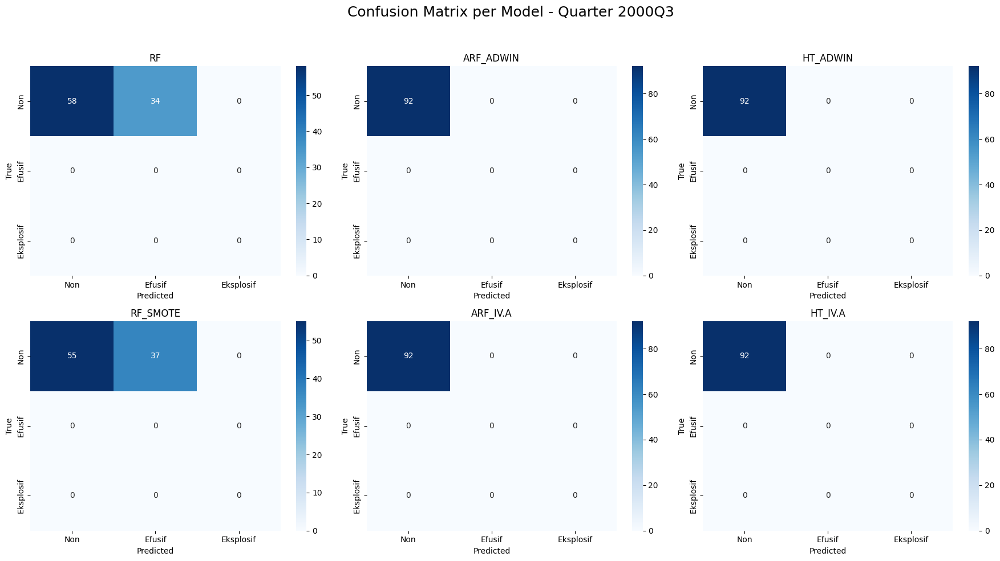

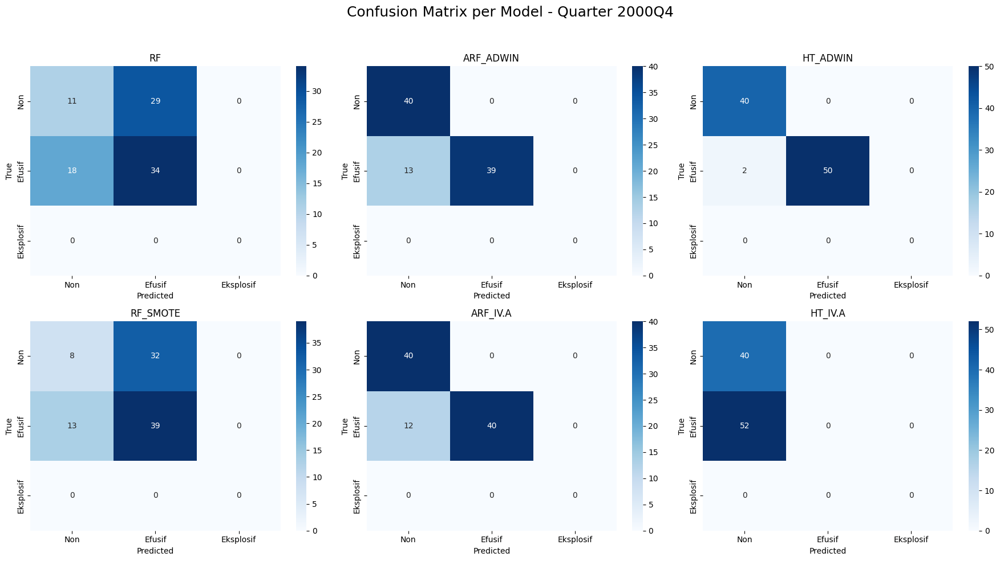

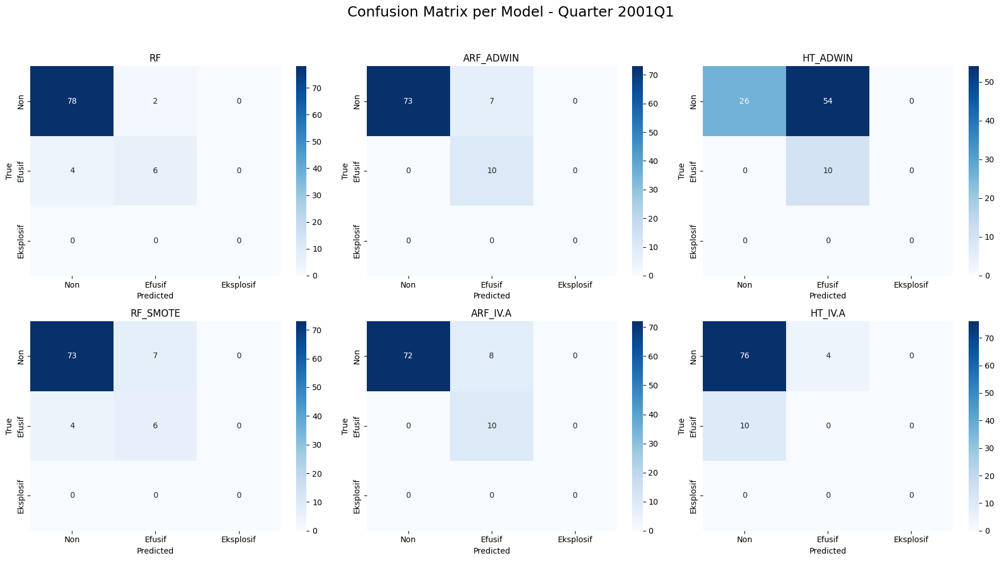

...

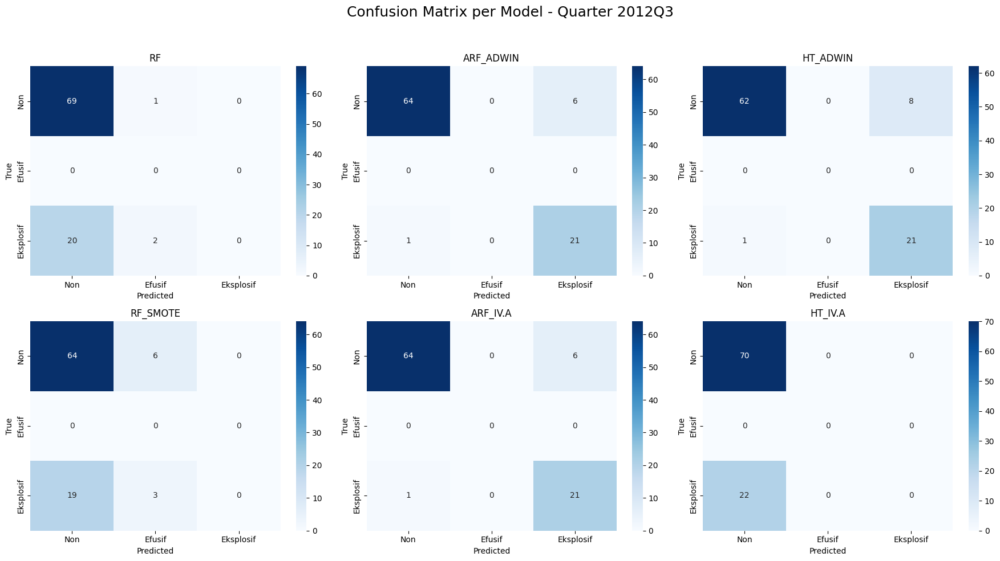

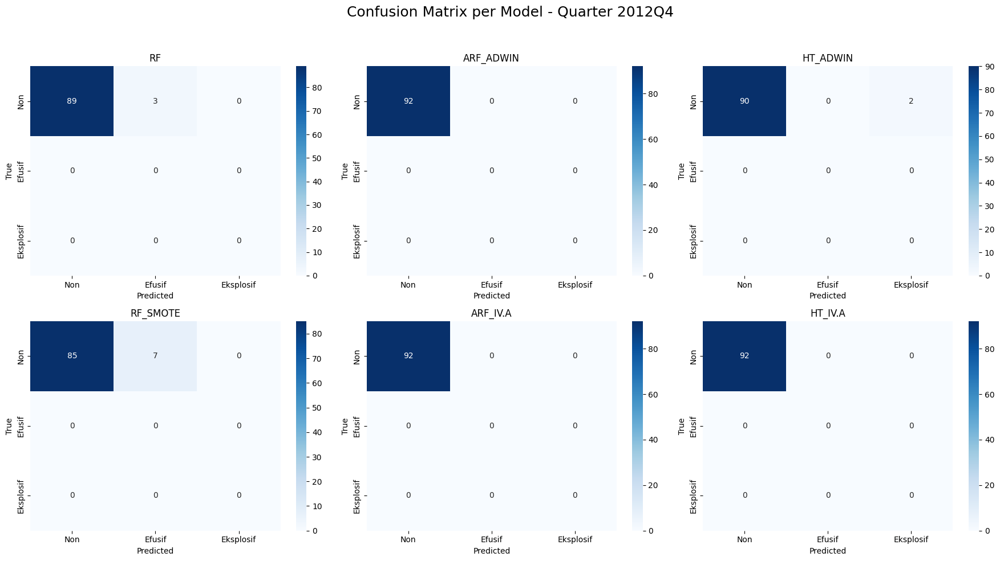

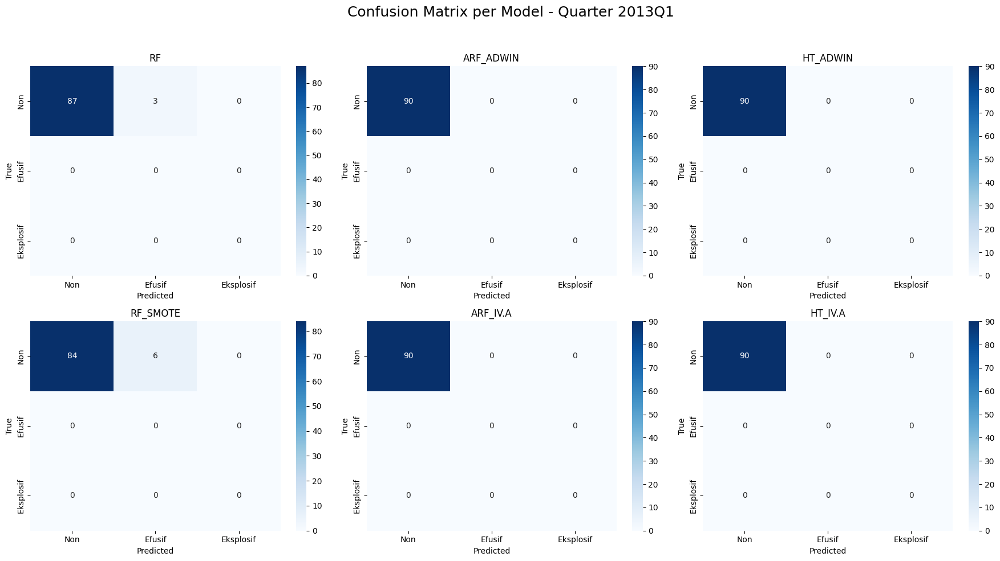

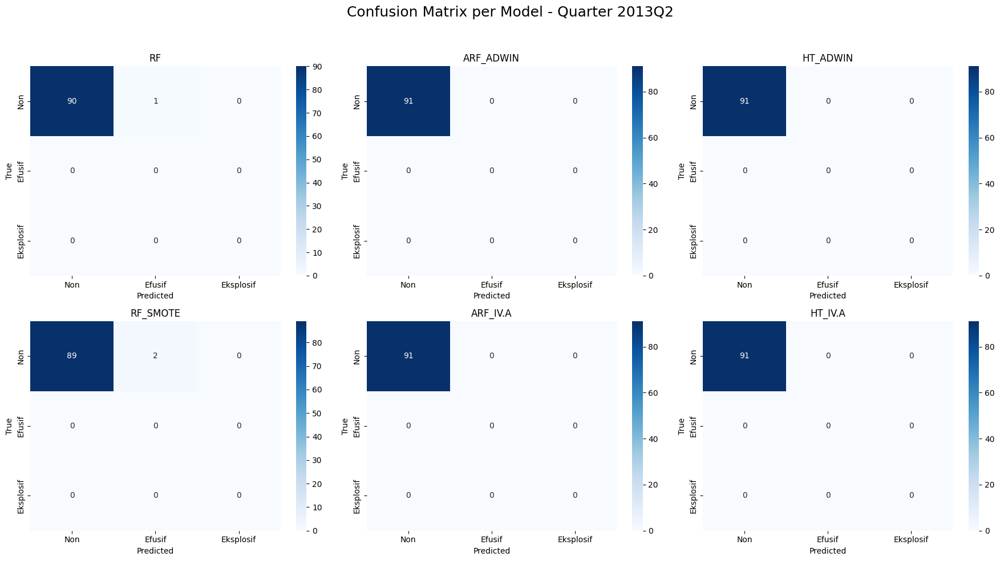

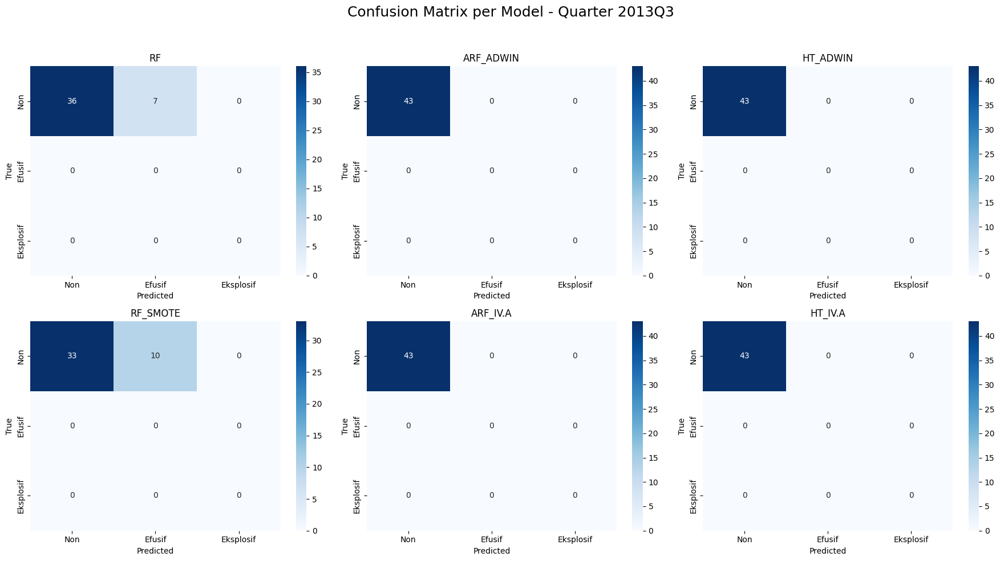

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Siapkan dataframe evaluasi
eval_df = pd.DataFrame({
    'Date': pd.to_datetime(dates_stream),
    'True': all_true,
    'RF': rf_pred,
    'RF_SMOTE': rf_smote_pred,
    'ARF_ADWIN': arf_adwin_pred,
    'ARF_IV.A': arf_sel_pred,
    'HT_ADWIN': ht_adwin_pred,
    'HT_IV.A': ht_sel_pred
})

# Tambahkan kolom periodik triwulan
eval_df['Period'] = eval_df['Date'].dt.to_period('Q')

# Ambil semua period unik setelah tahun 2000
periods = sorted(eval_df[eval_df['Date'].dt.year >= 2000]['Period'].unique())

# Atur layout model vertikal: atas & bawah per pasangan
models = [
    ['RF', 'RF_SMOTE'],
    ['ARF_ADWIN', 'ARF_IV.A'],
    ['HT_ADWIN', 'HT_IV.A']
]
labels = ['Non', 'Efusif', 'Eksplosif']

# Loop tiap periode
for period in periods:
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))  # Grid 2x3
    quarter_data = eval_df[eval_df['Period'] == period]

    for col in range(3):
        for row in range(2):
            model = models[col][row]
            ax = axes[row, col]
            cm = confusion_matrix(quarter_data['True'], quarter_data[model], labels=[0, 1, 2])
            sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                        xticklabels=labels, yticklabels=labels)
            ax.set_title(model)
            ax.set_xlabel('Predicted')
            ax.set_ylabel('True')

    plt.suptitle(f'Confusion Matrix per Model - Quarter {period}', fontsize=18)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


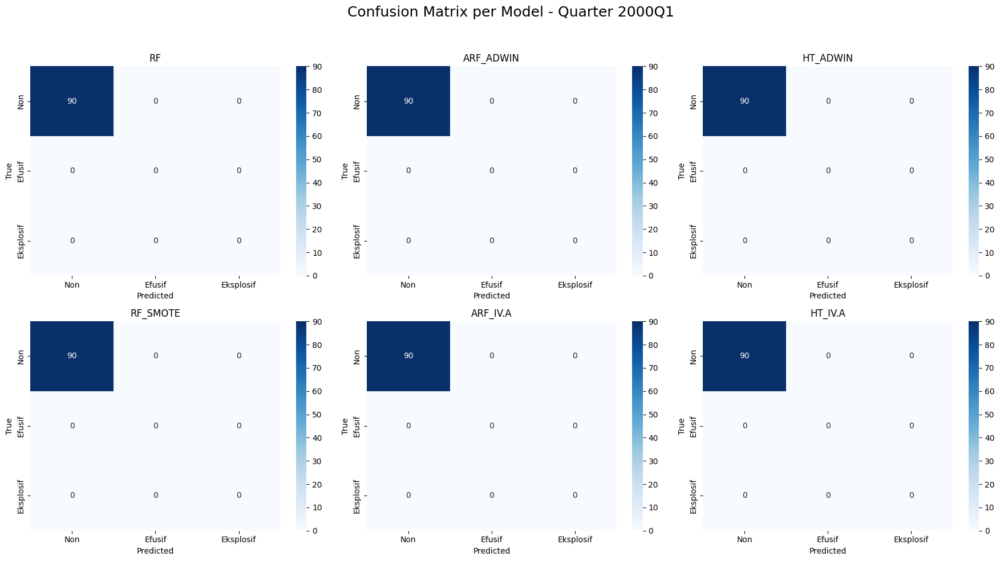

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2000Q1.png


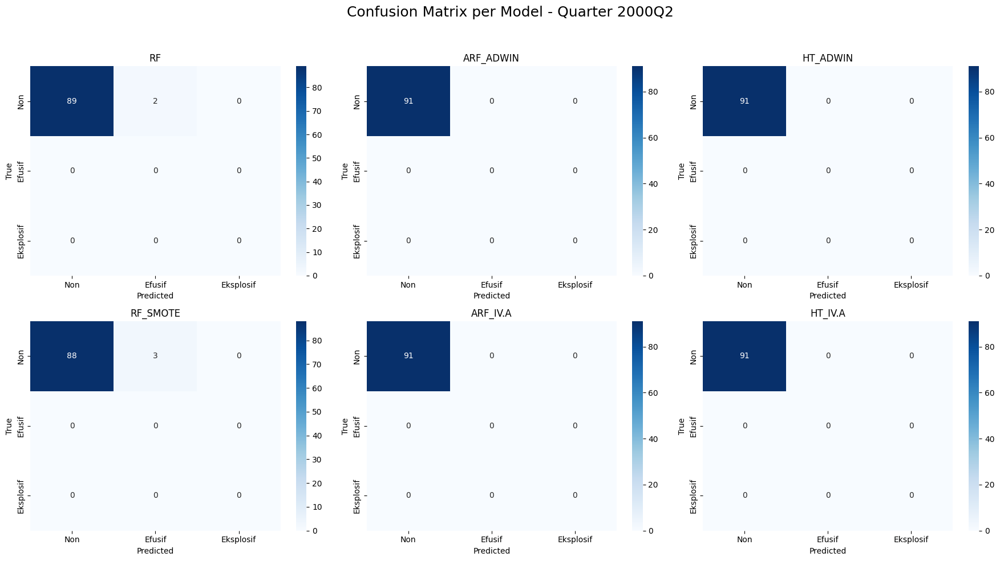

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2000Q2.png


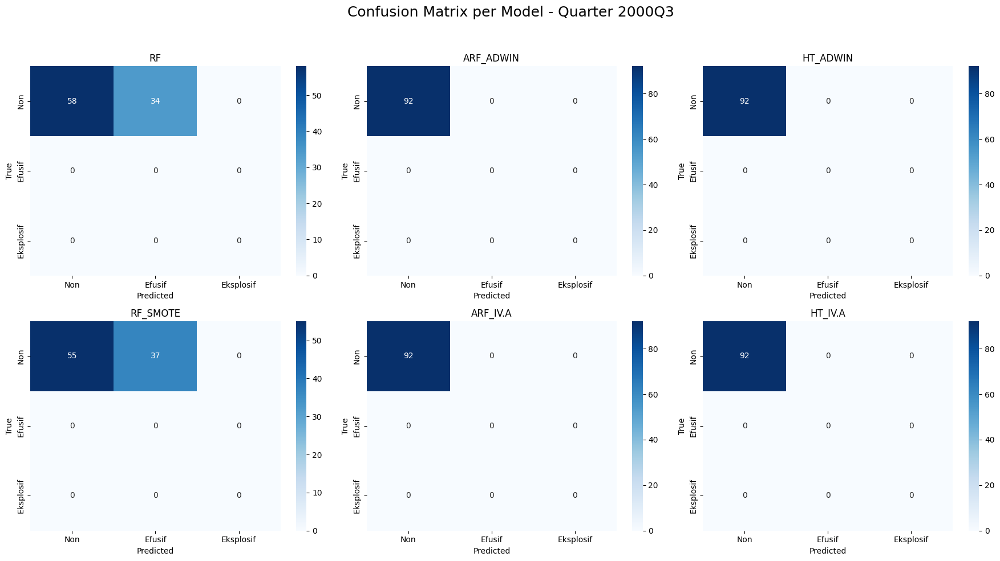

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2000Q3.png


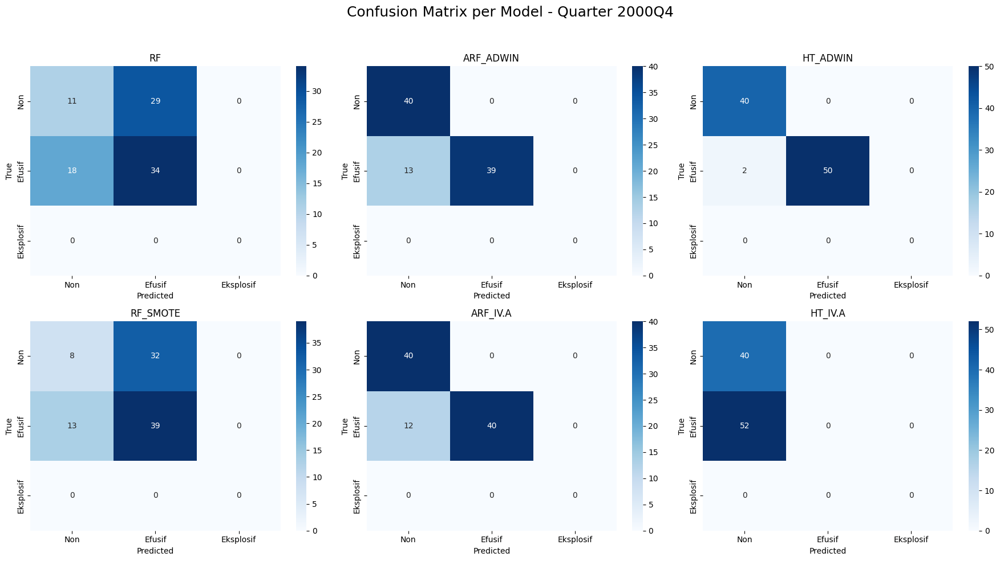

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2000Q4.png


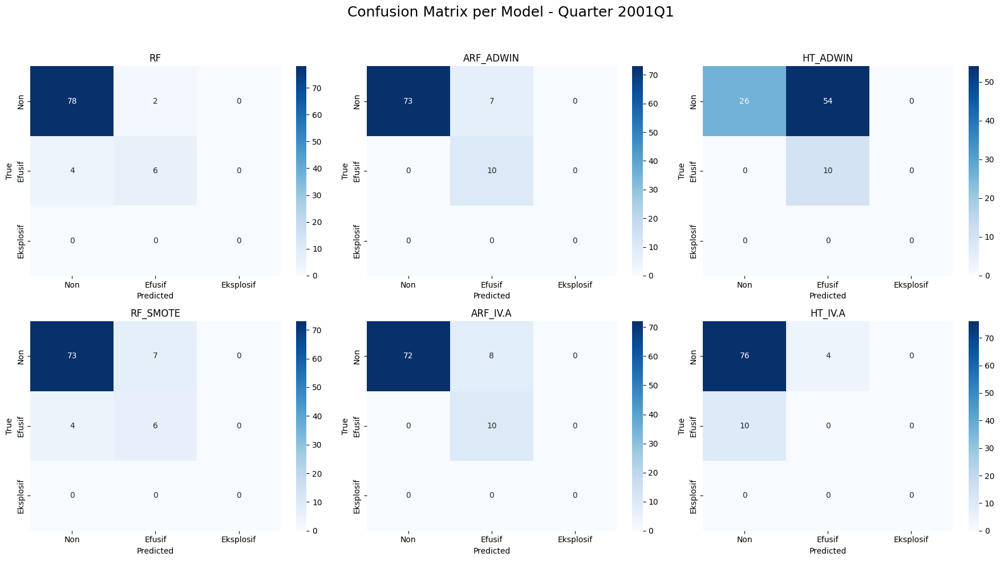

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2001Q1.png


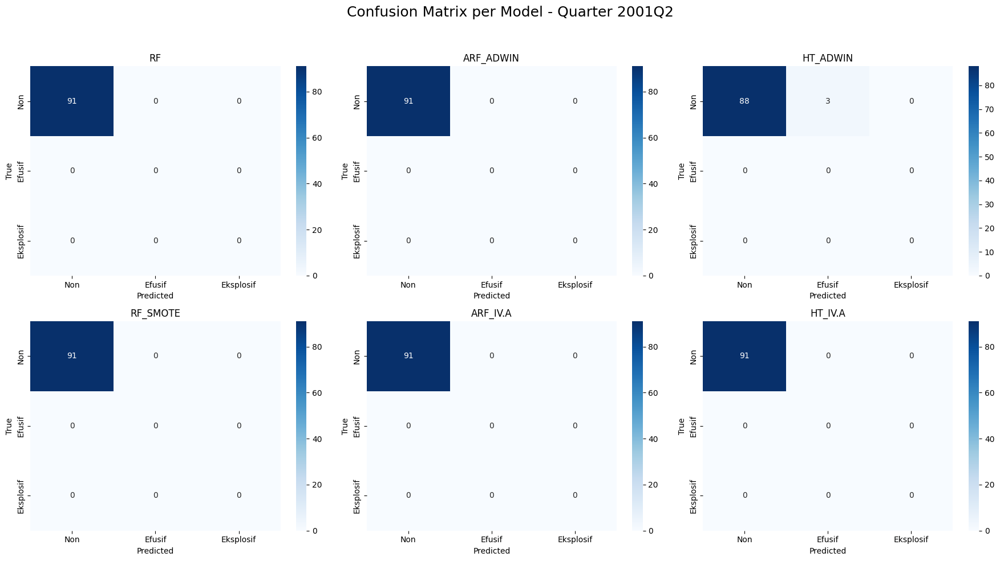

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2001Q2.png


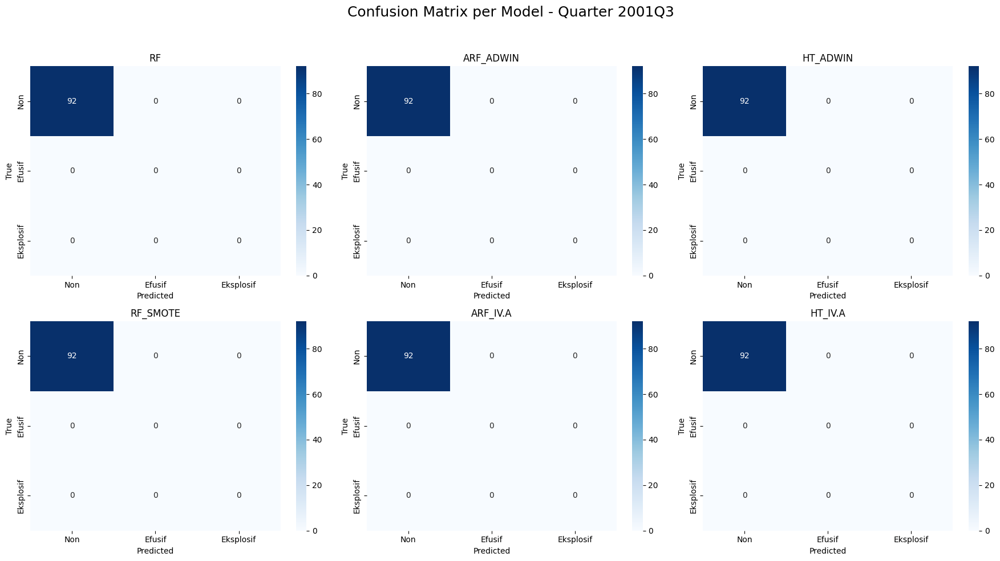

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2001Q3.png


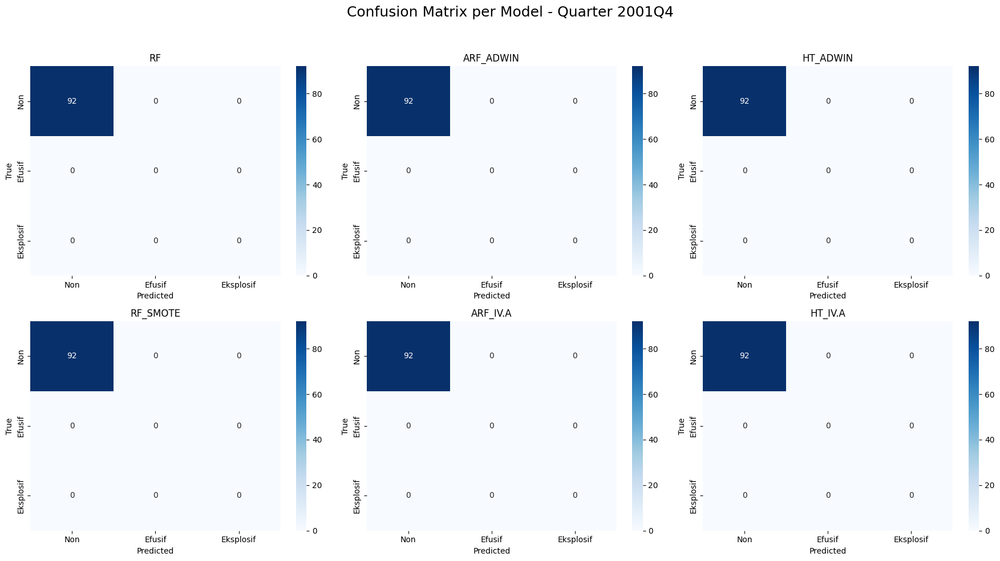

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2001Q4.png


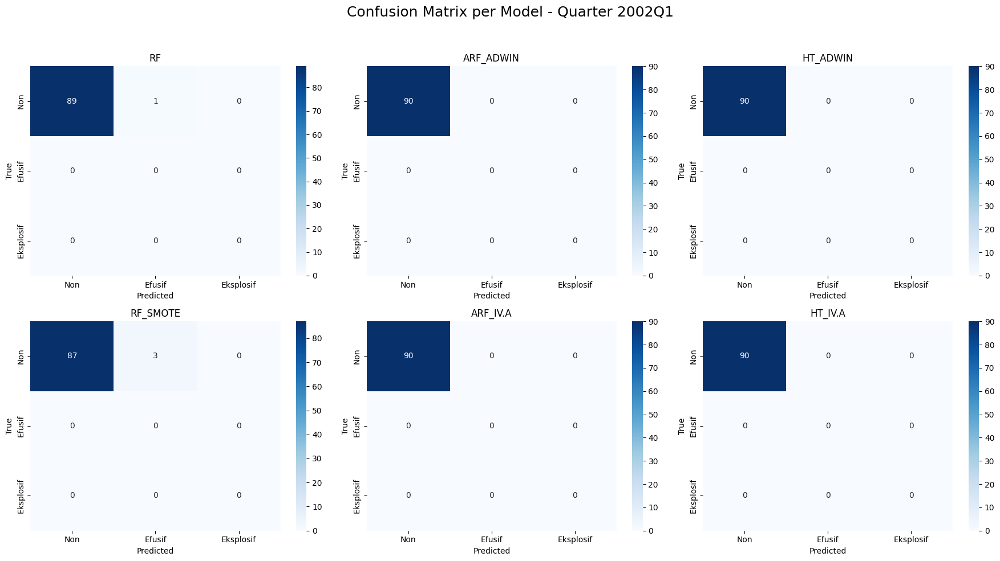

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2002Q1.png


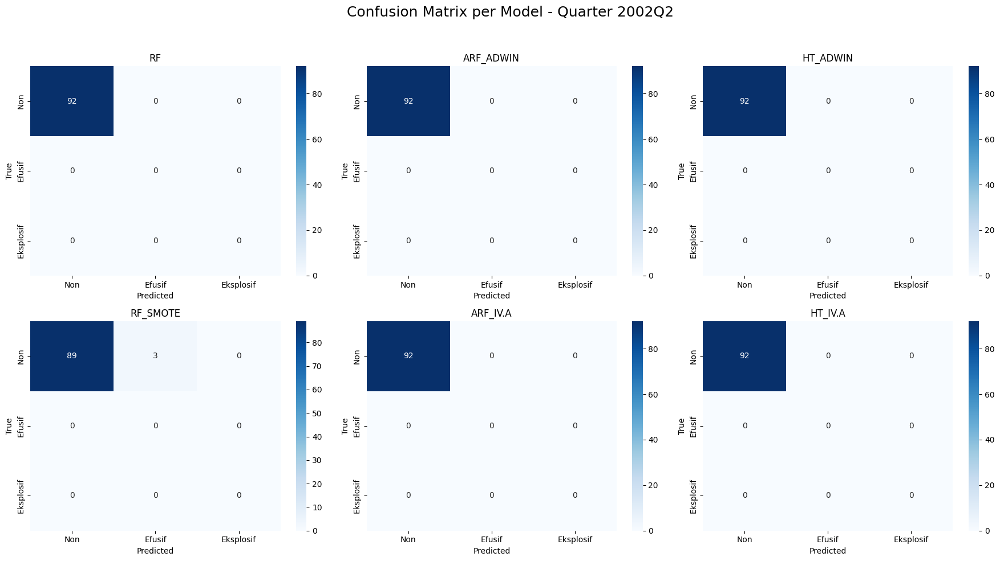

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2002Q2.png


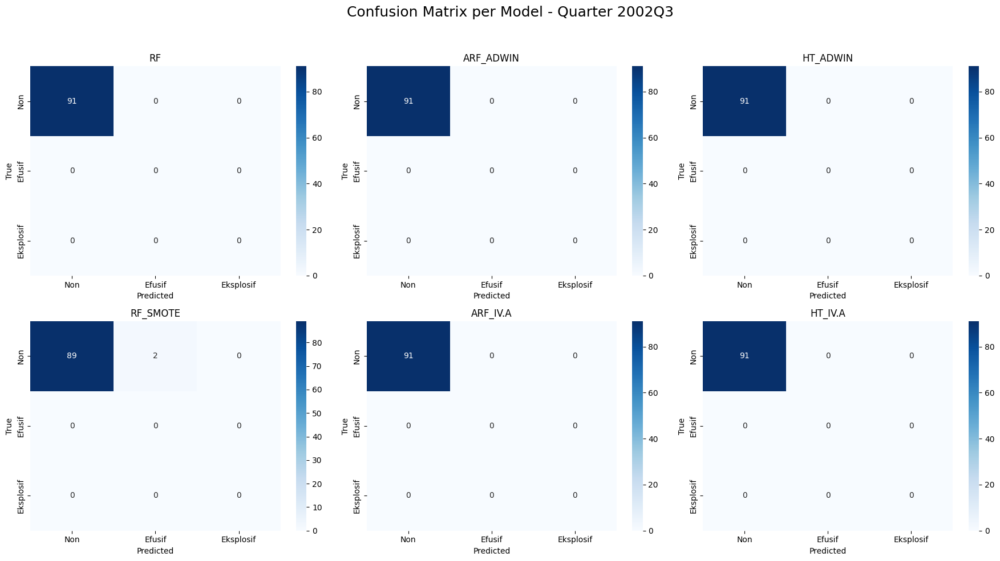

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2002Q3.png


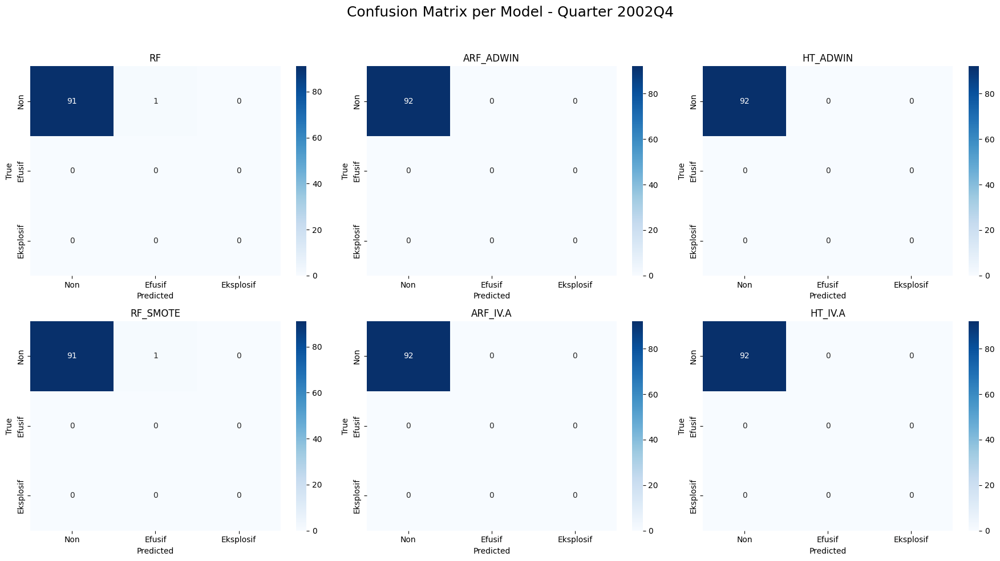

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2002Q4.png


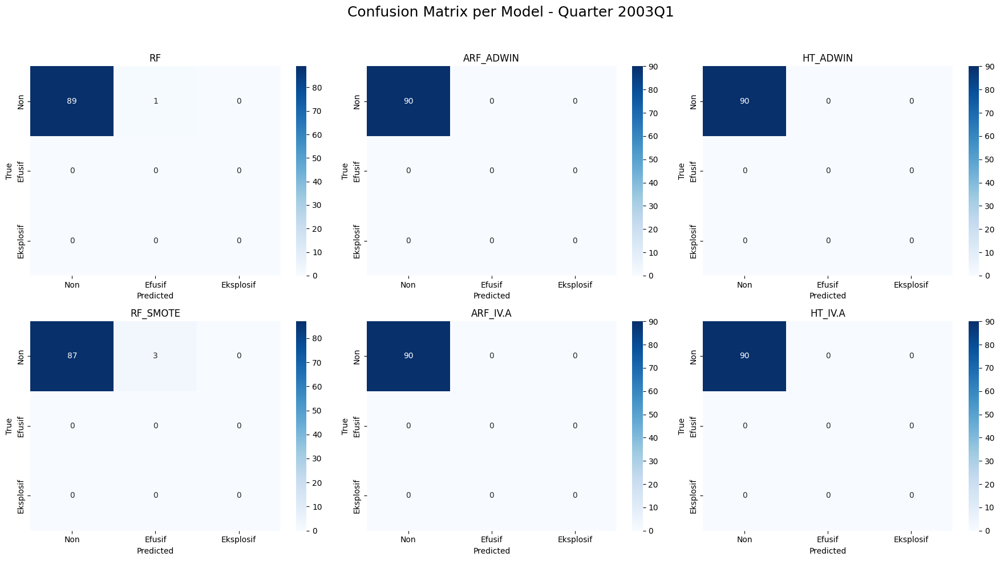

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2003Q1.png


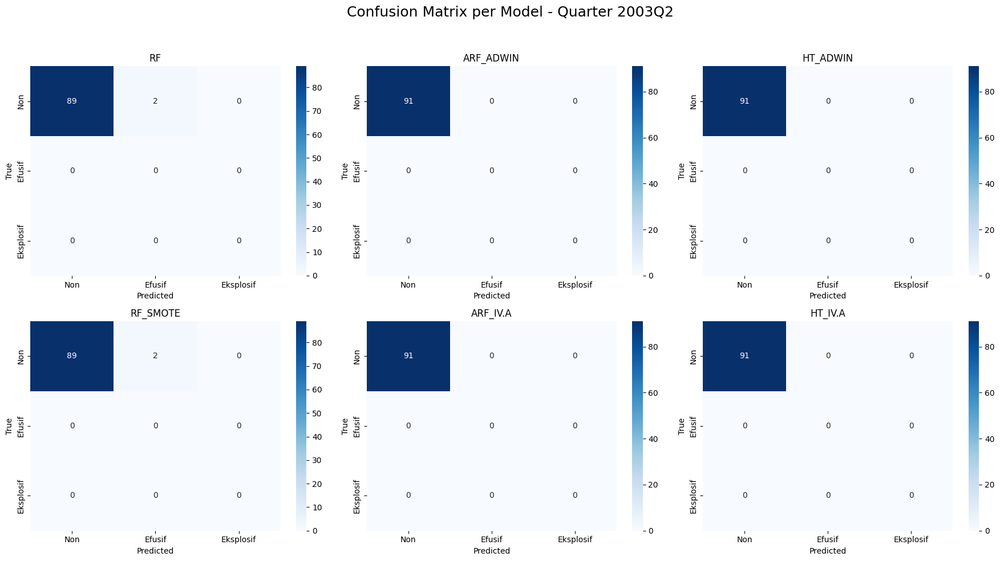

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2003Q2.png


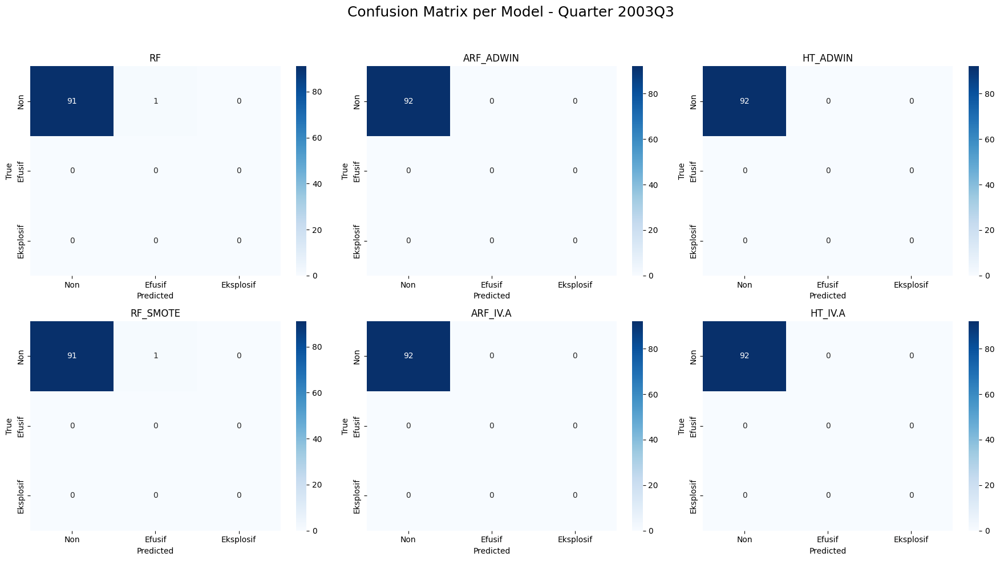

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2003Q3.png


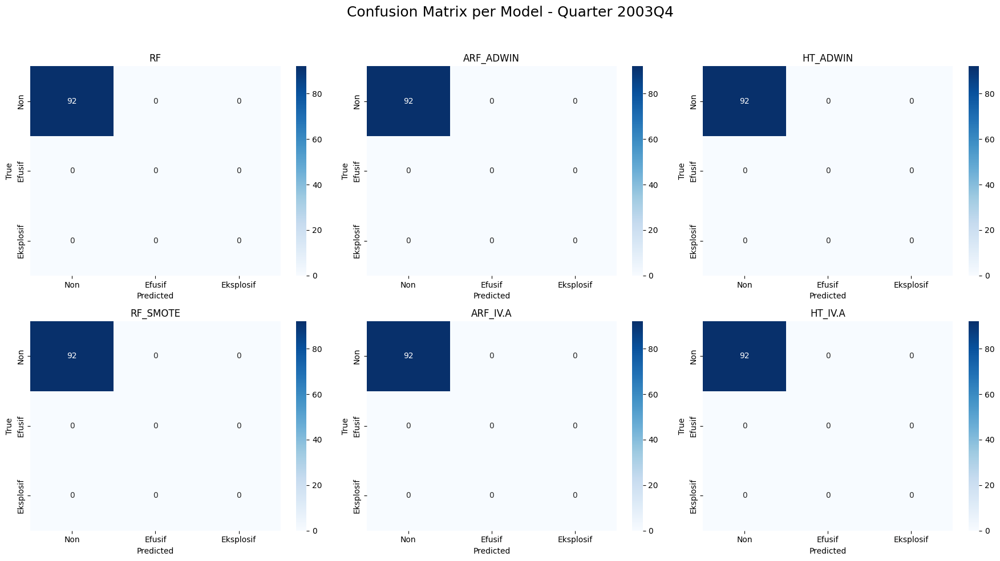

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2003Q4.png


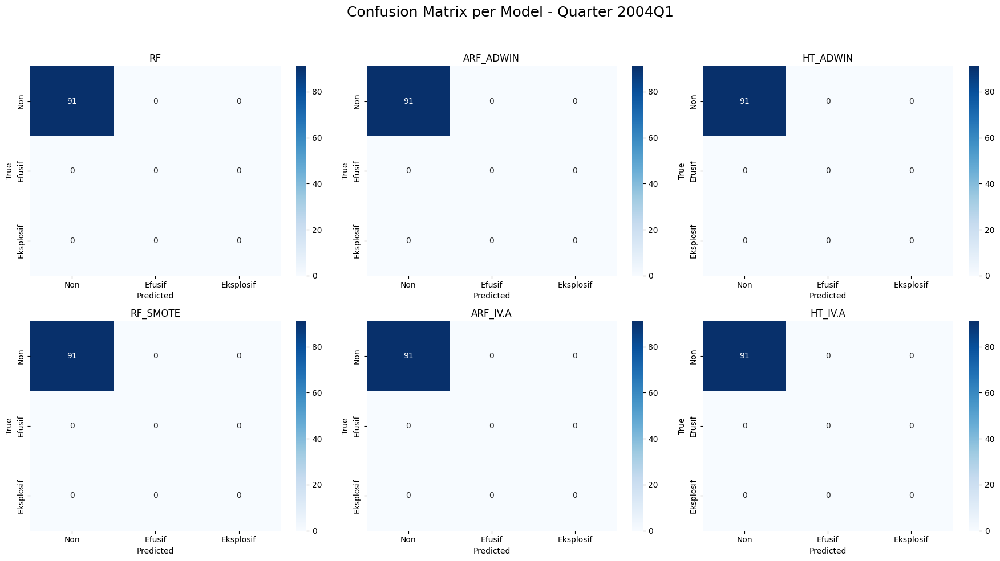

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2004Q1.png


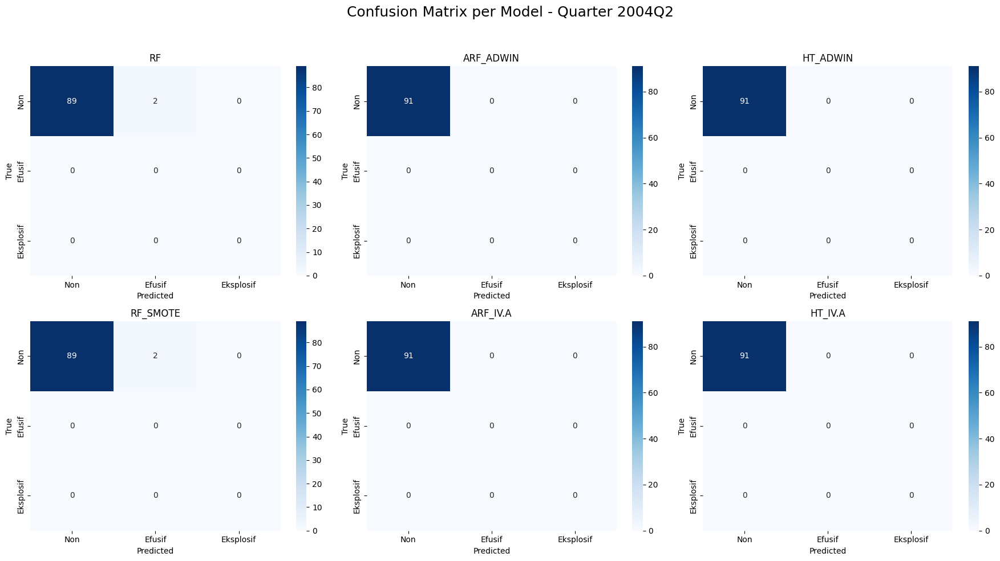

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2004Q2.png


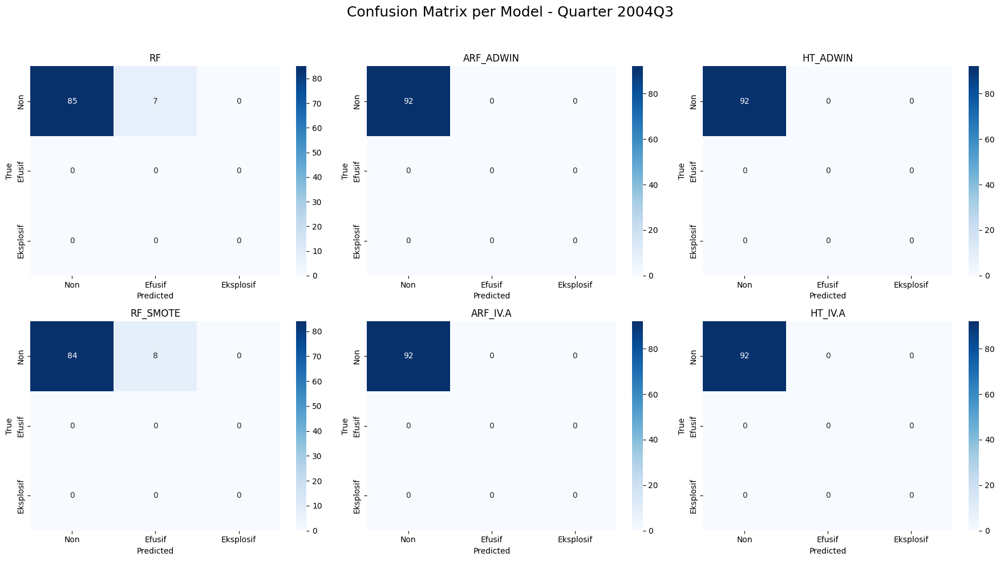

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2004Q3.png


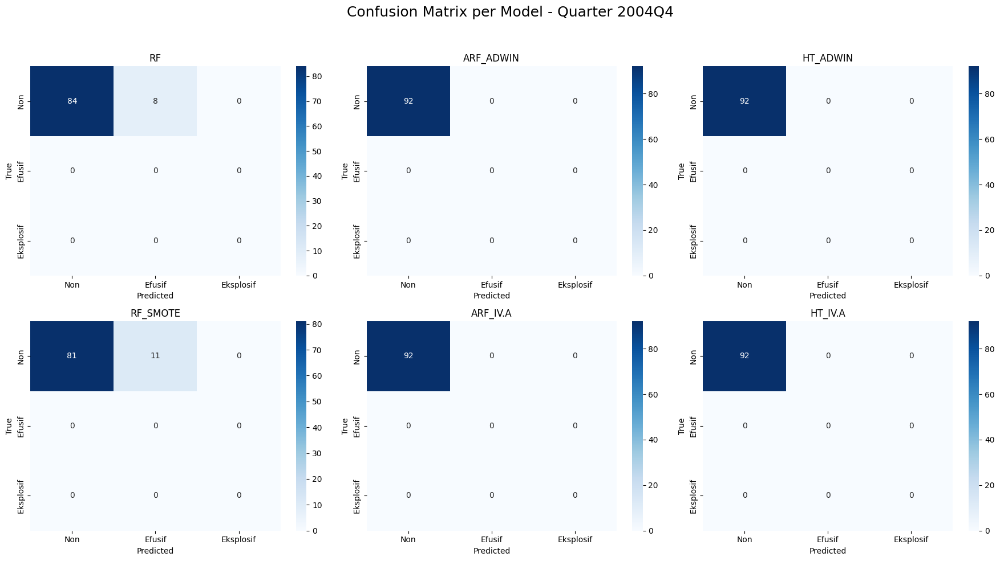

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2004Q4.png


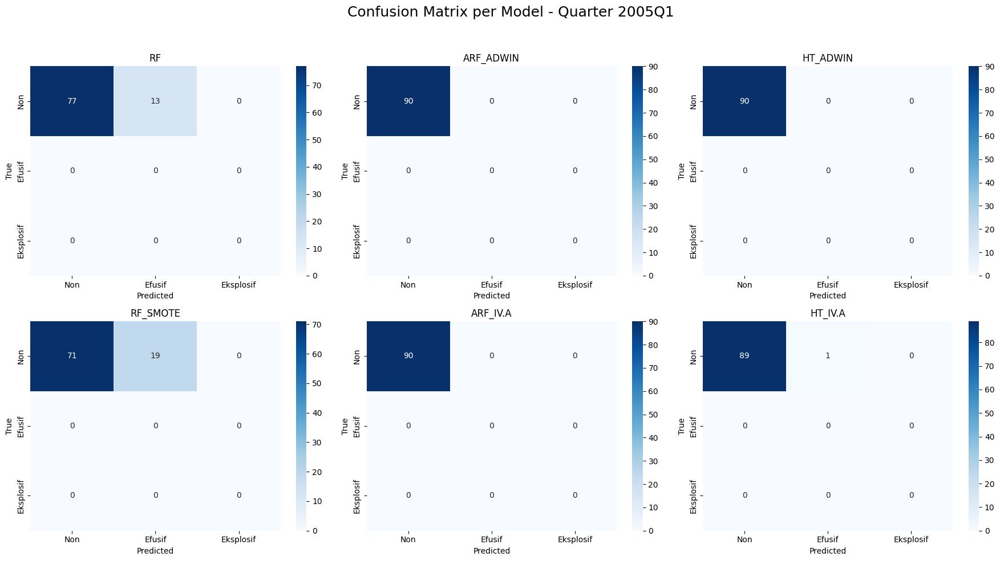

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2005Q1.png


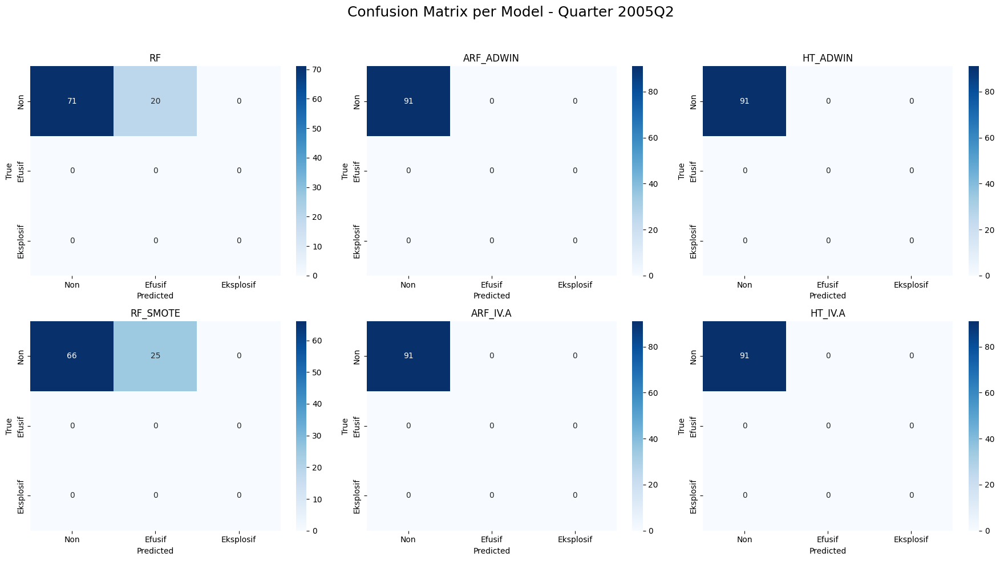

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2005Q2.png


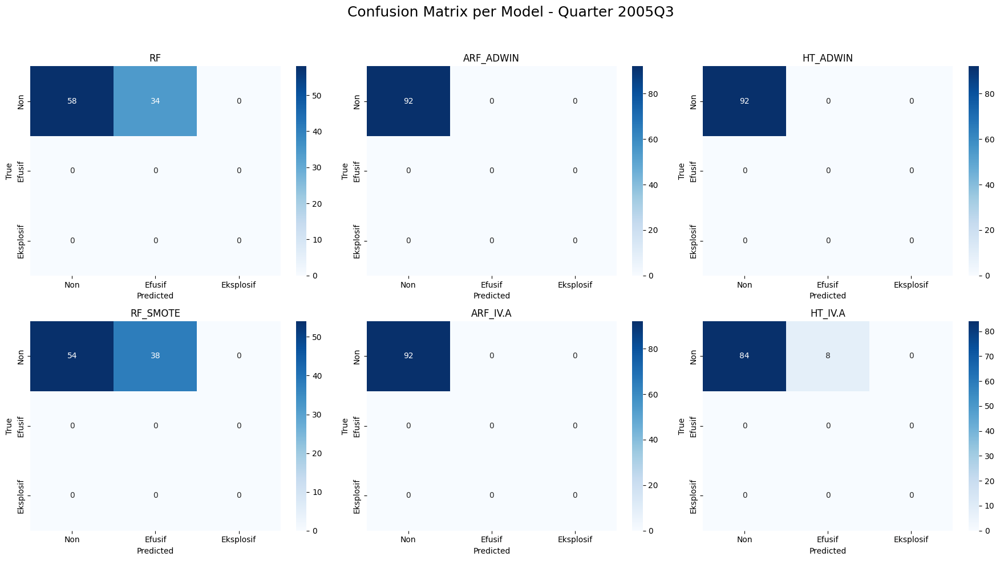

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2005Q3.png


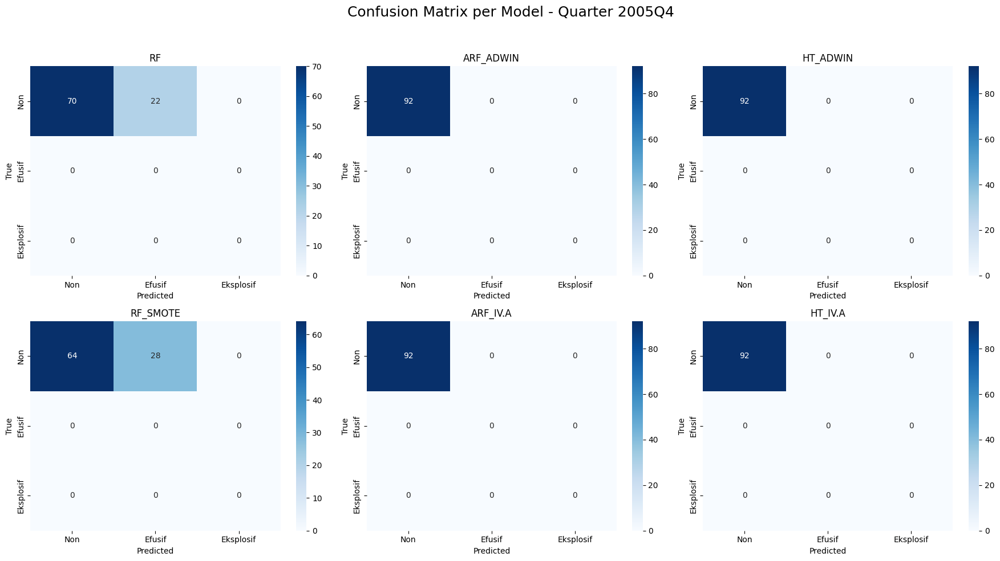

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2005Q4.png


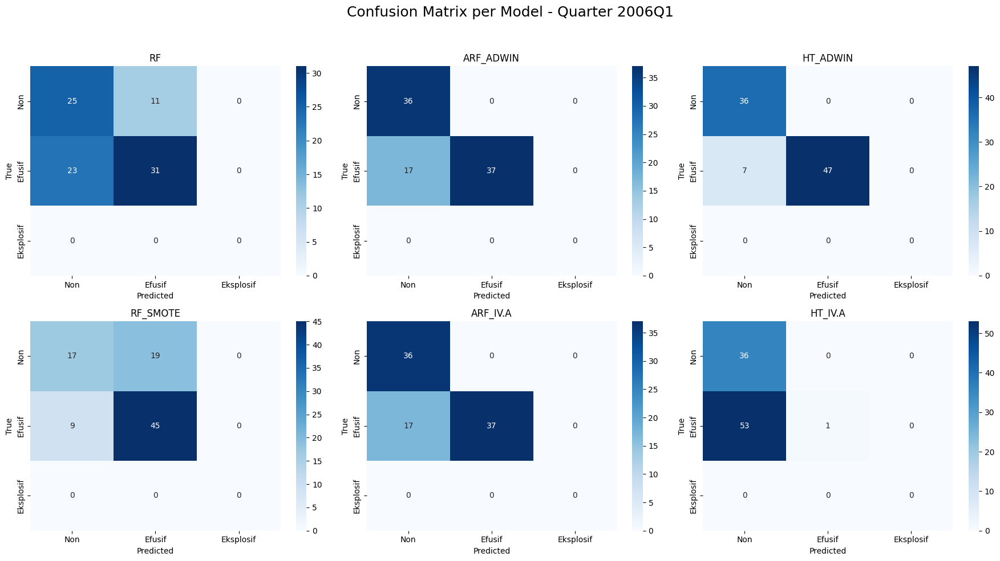

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2006Q1.png


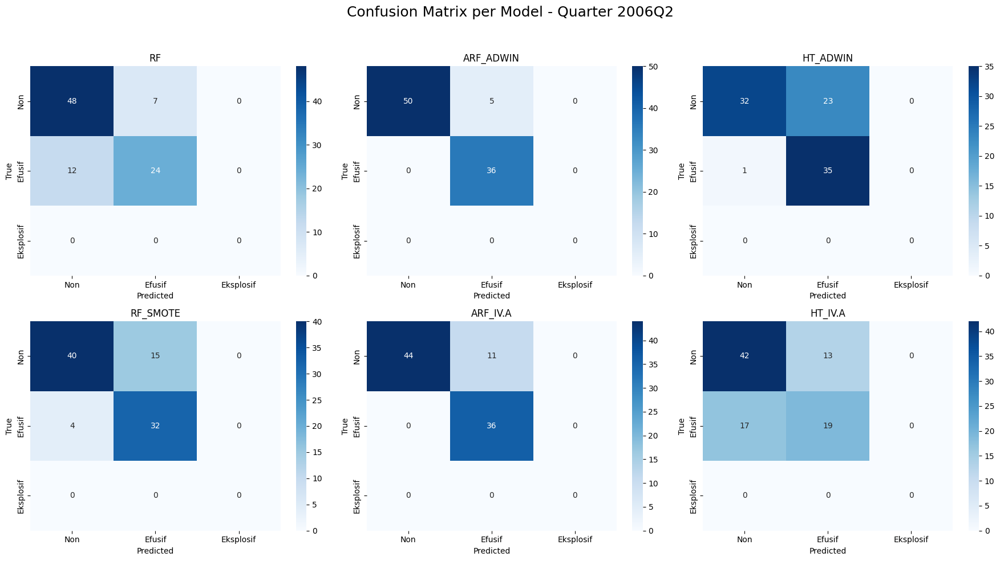

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2006Q2.png


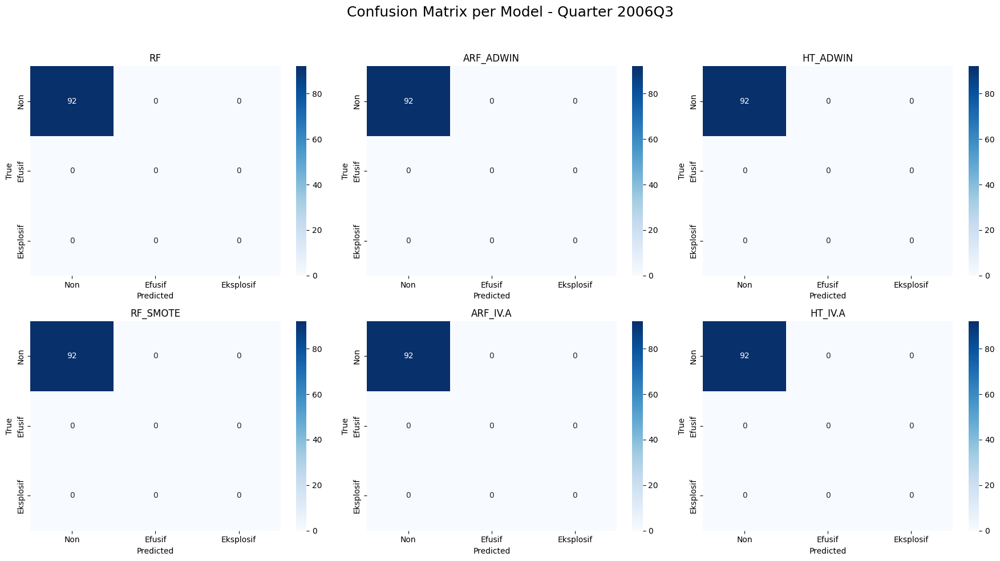

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2006Q3.png


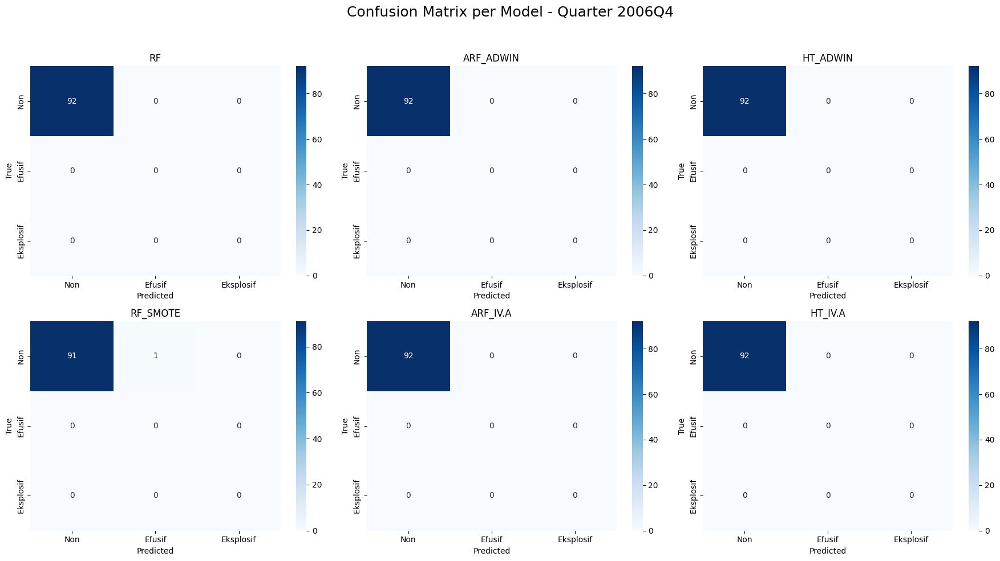

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2006Q4.png


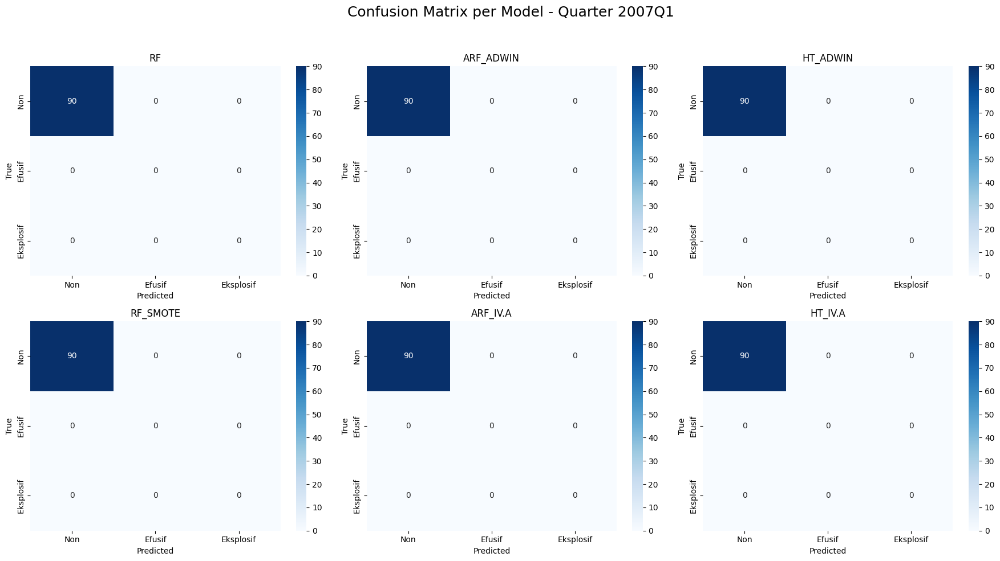

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2007Q1.png


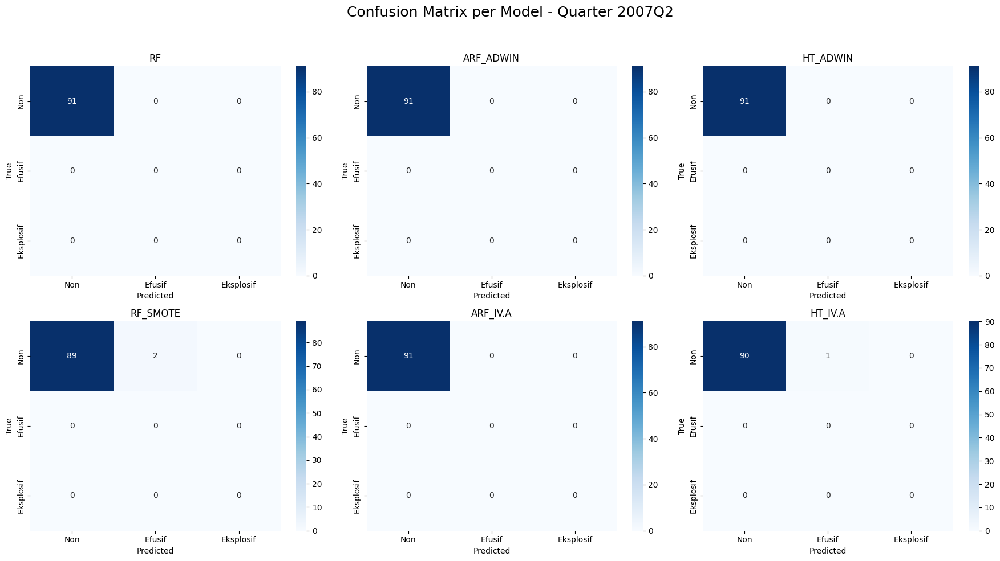

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2007Q2.png


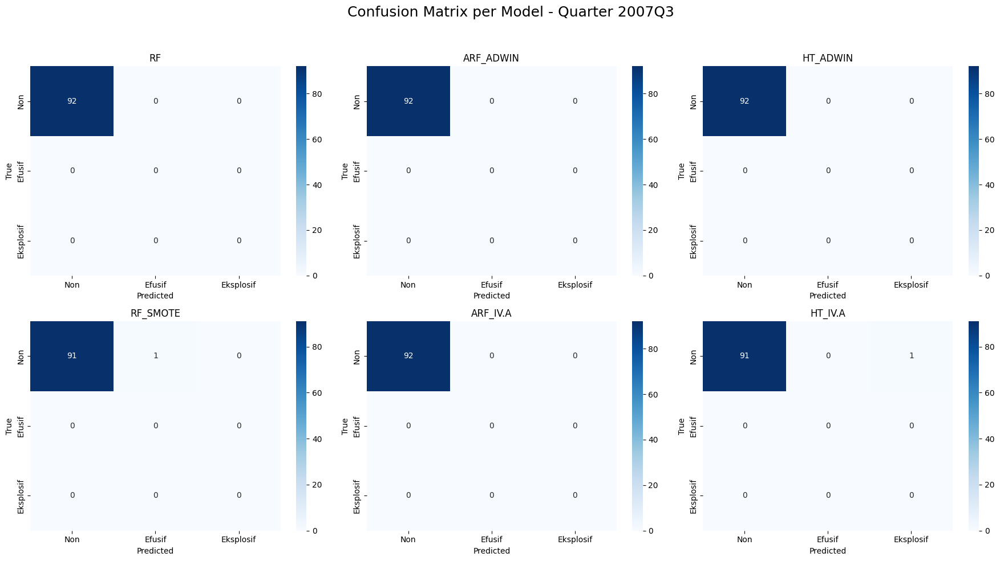

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2007Q3.png


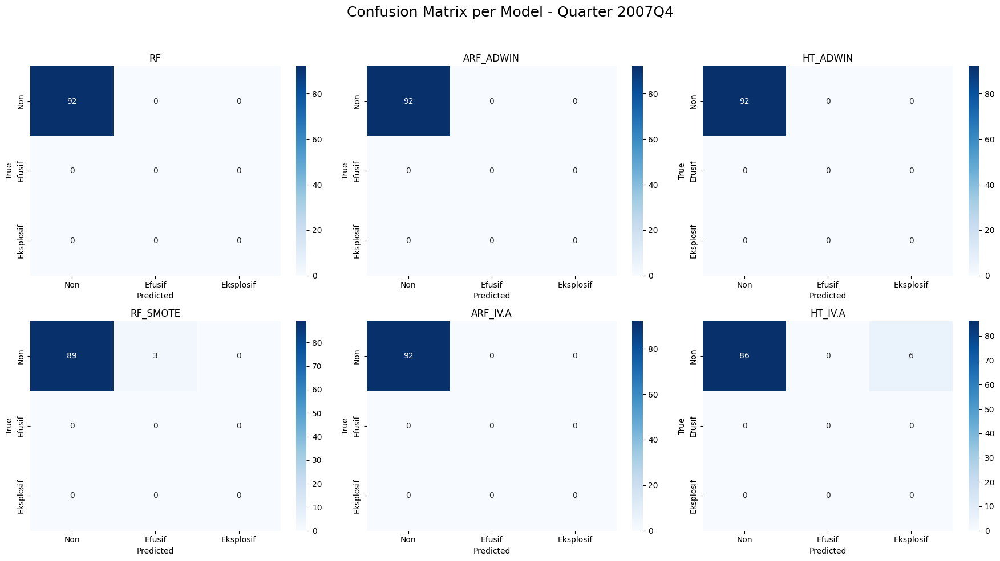

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2007Q4.png


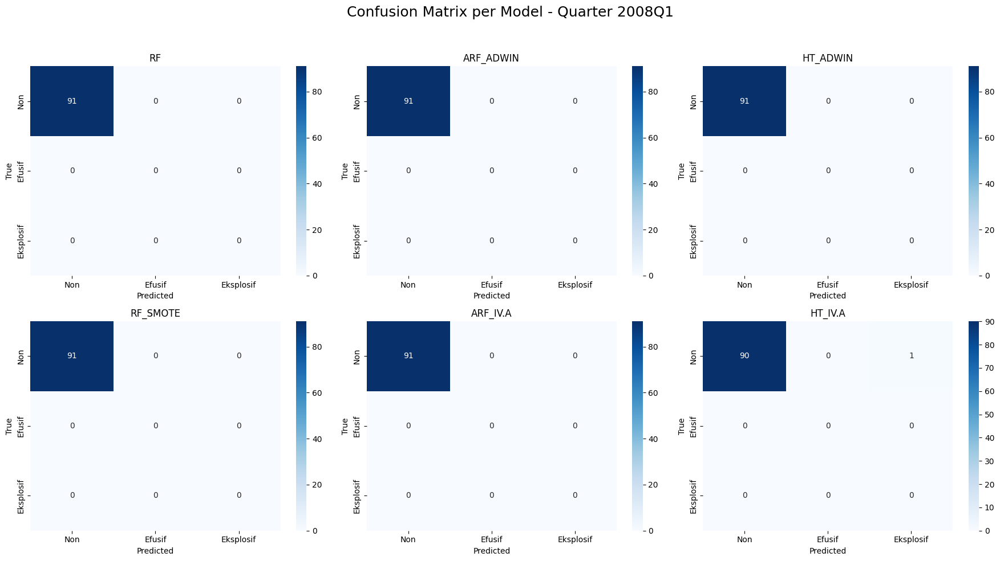

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2008Q1.png


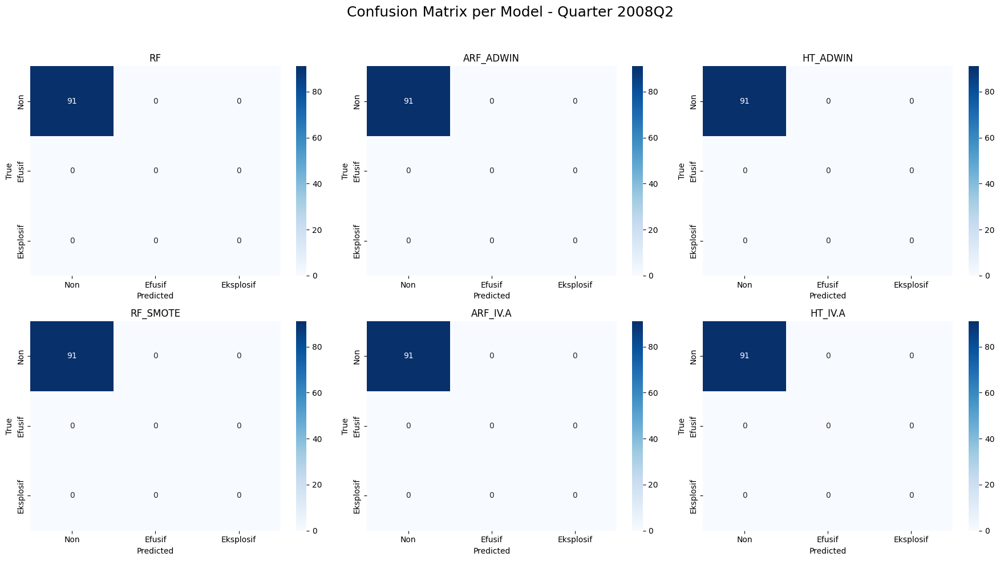

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2008Q2.png


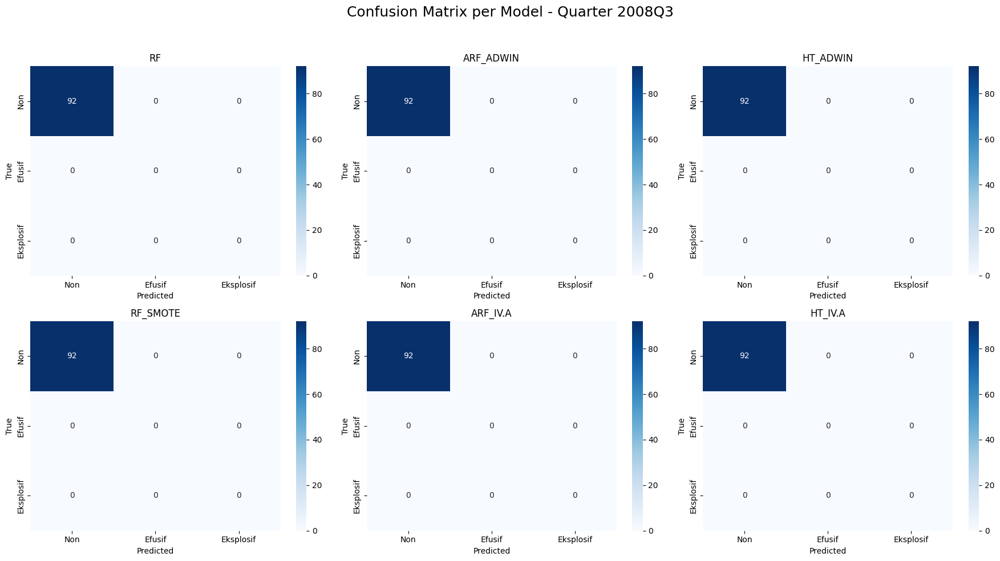

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2008Q3.png


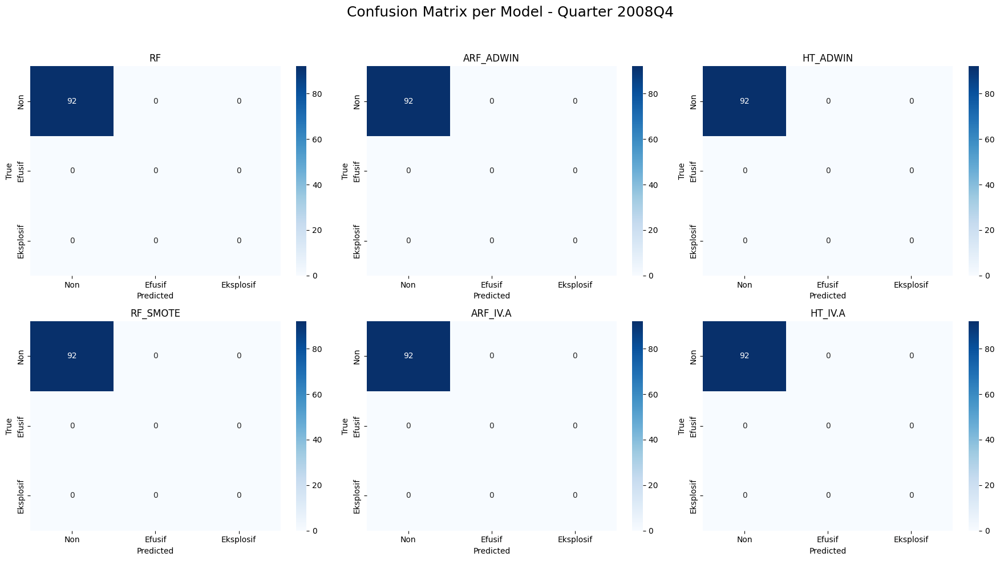

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2008Q4.png


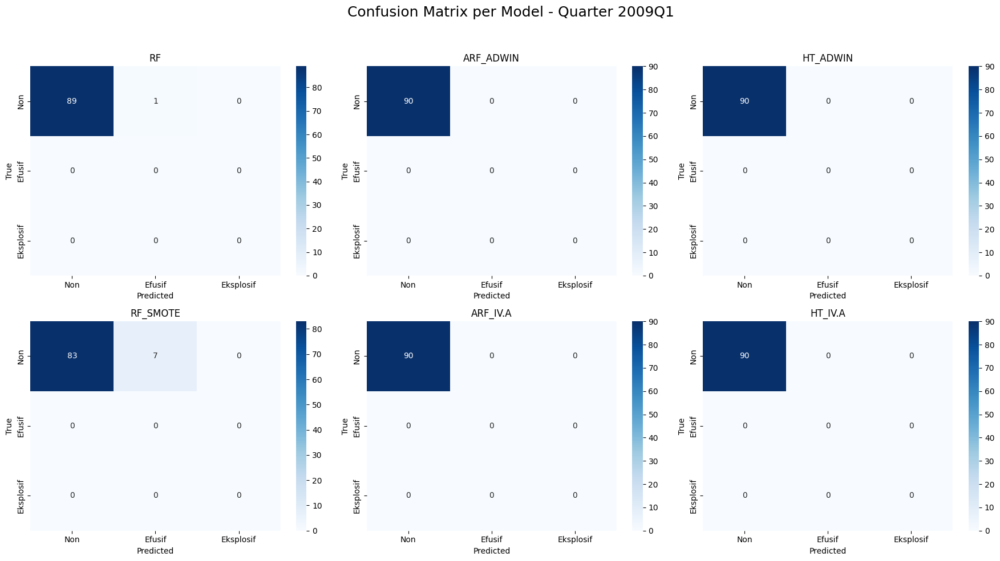

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2009Q1.png


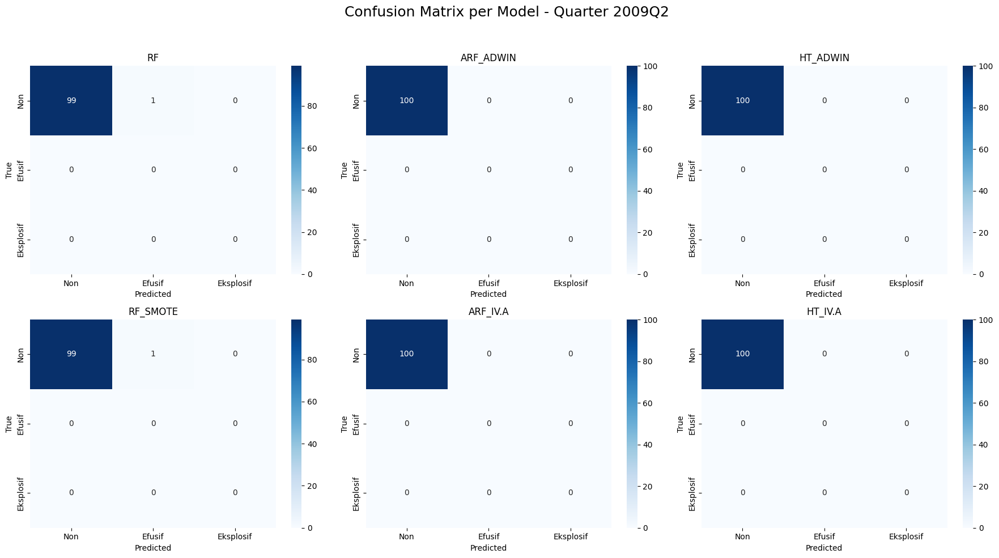

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2009Q2.png


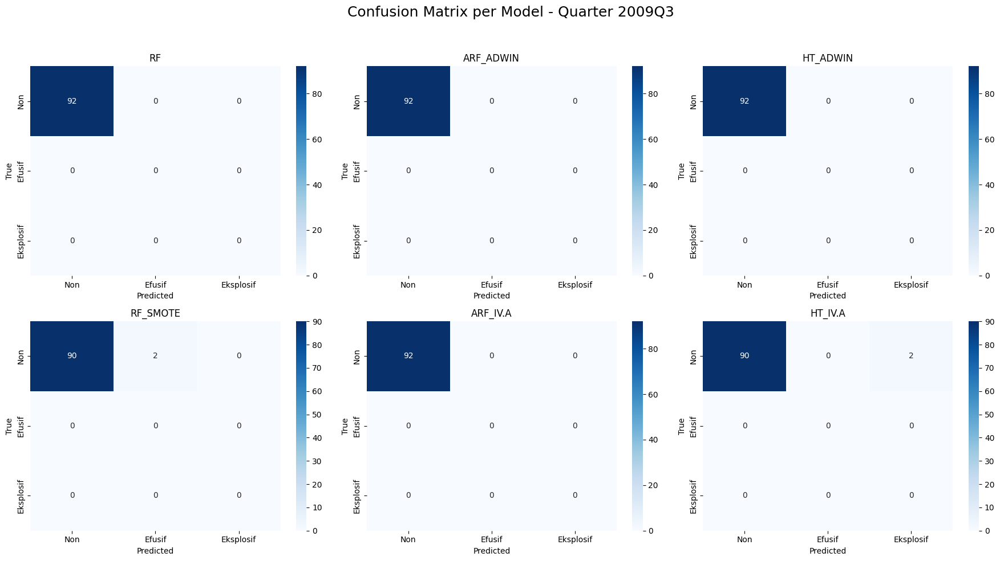

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2009Q3.png


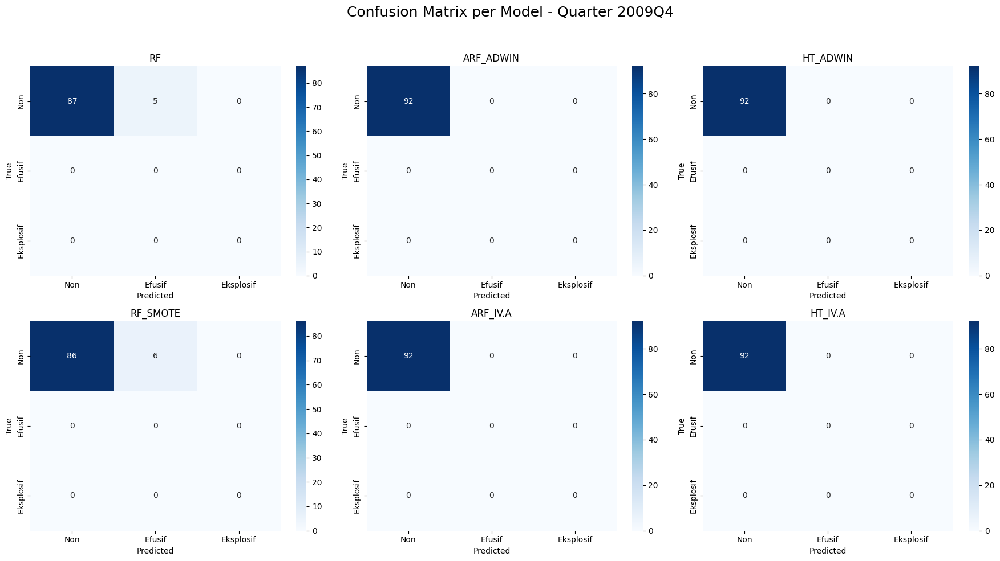

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2009Q4.png


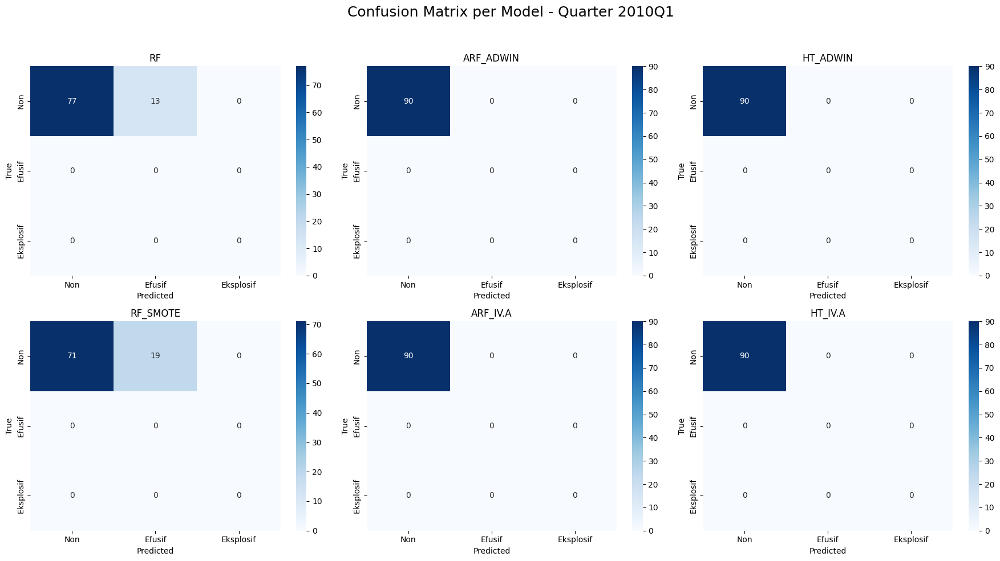

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2010Q1.png


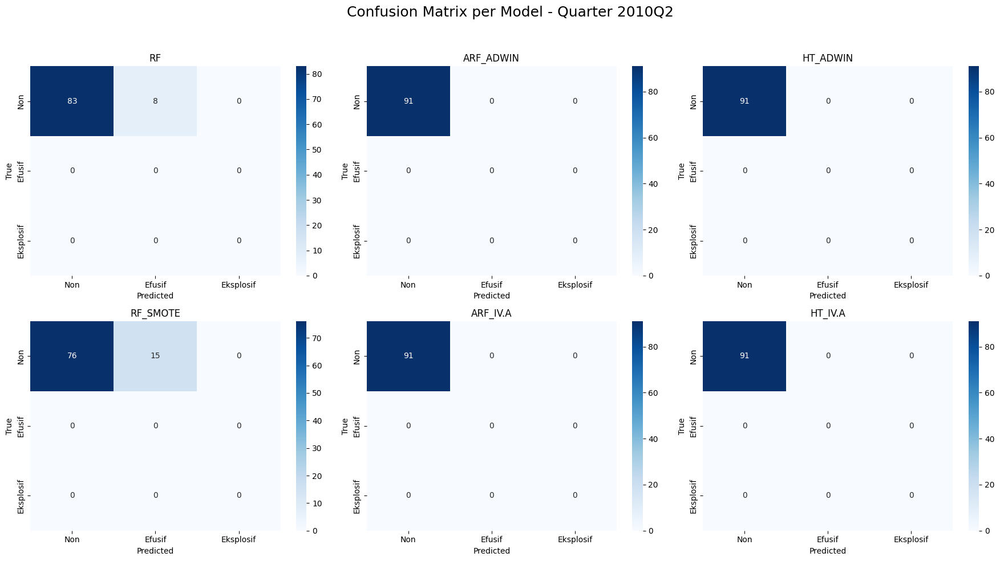

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2010Q2.png


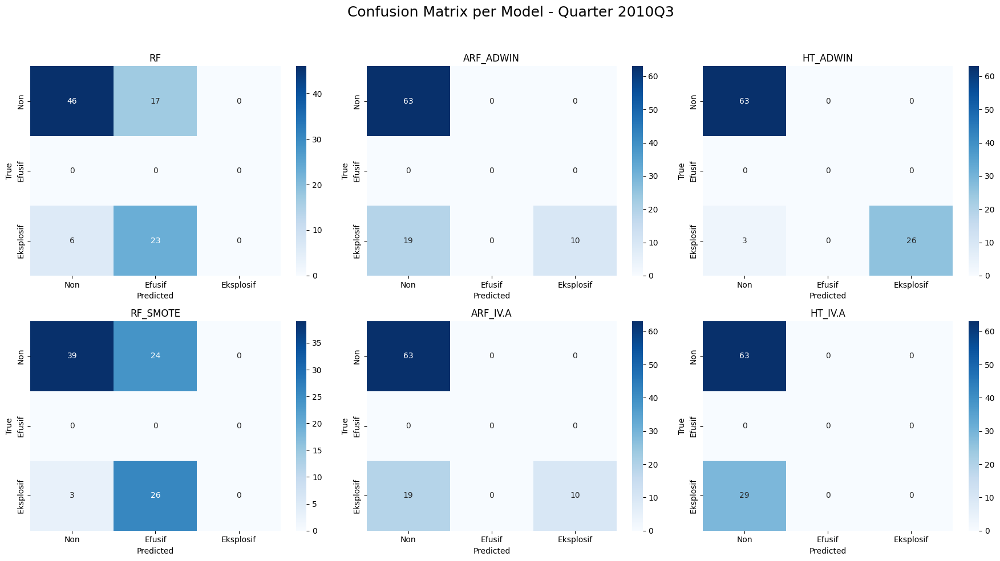

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2010Q3.png


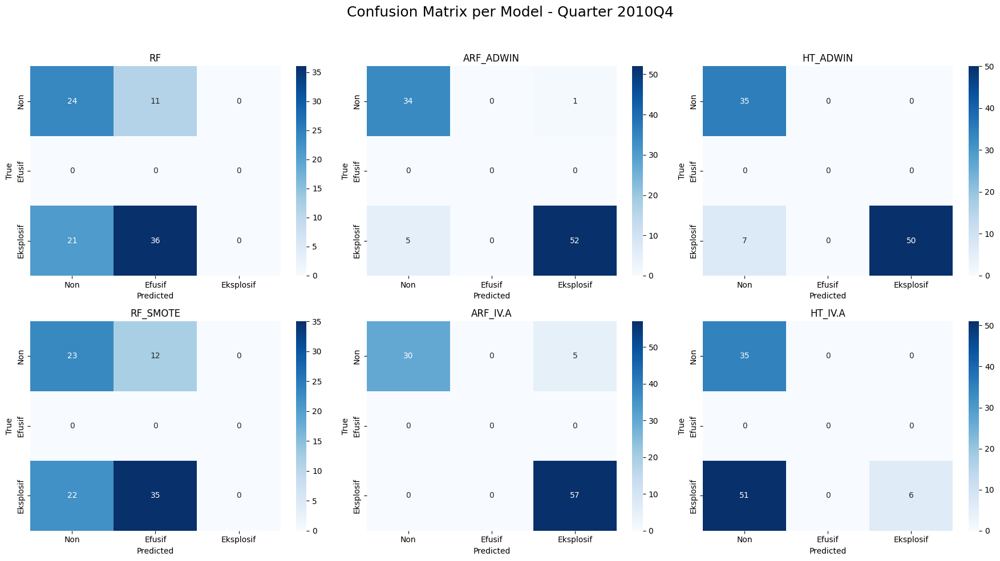

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2010Q4.png


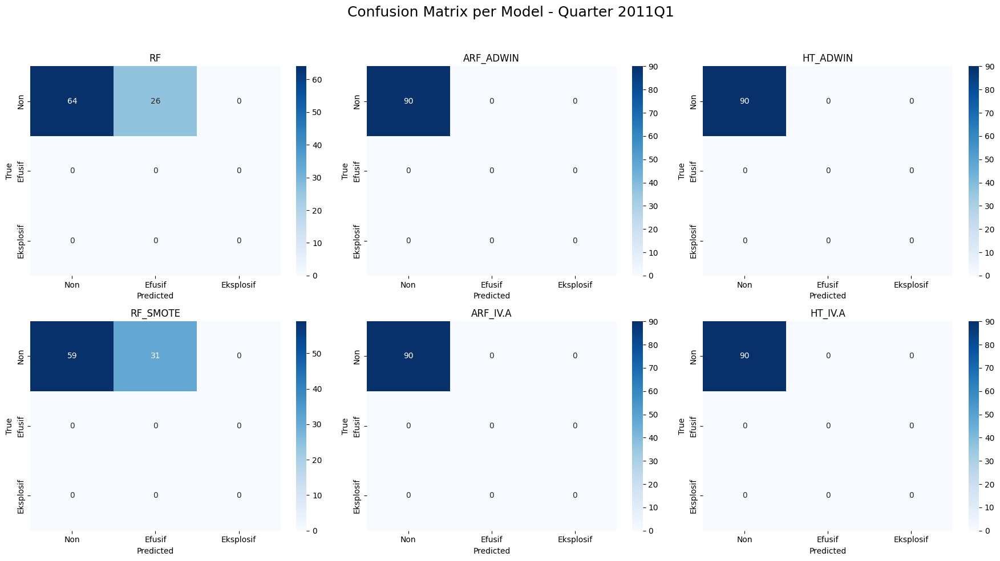

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2011Q1.png


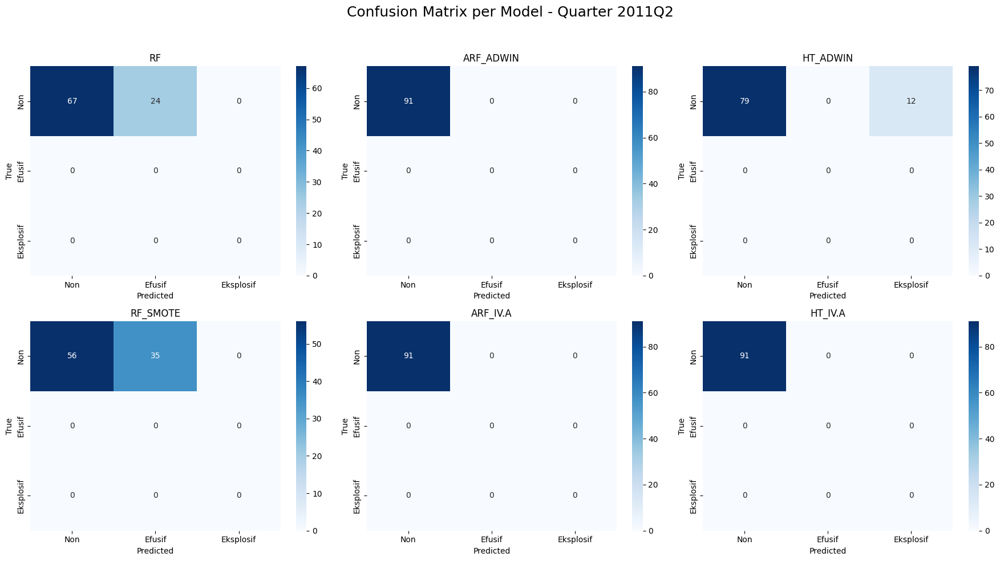

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2011Q2.png


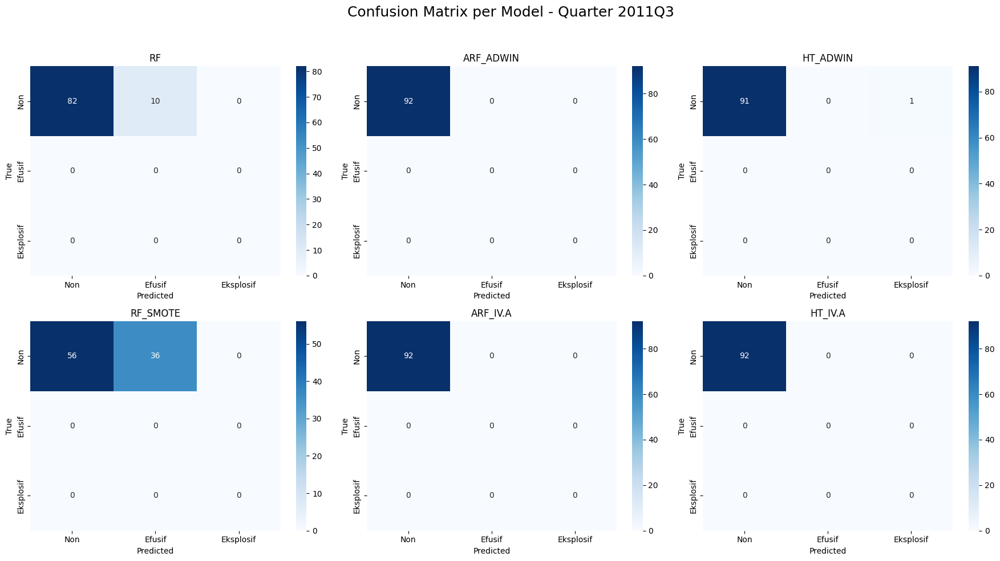

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2011Q3.png


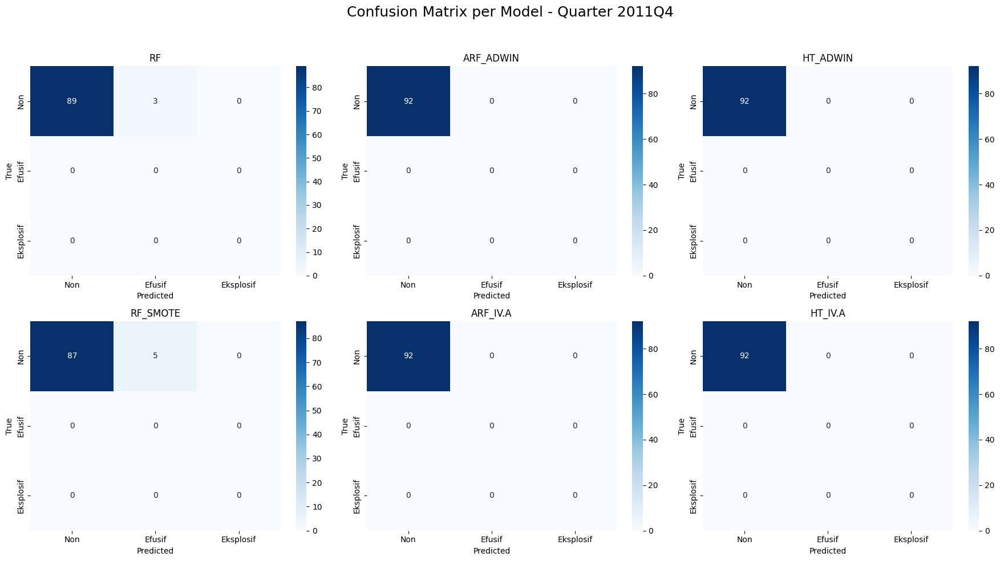

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2011Q4.png


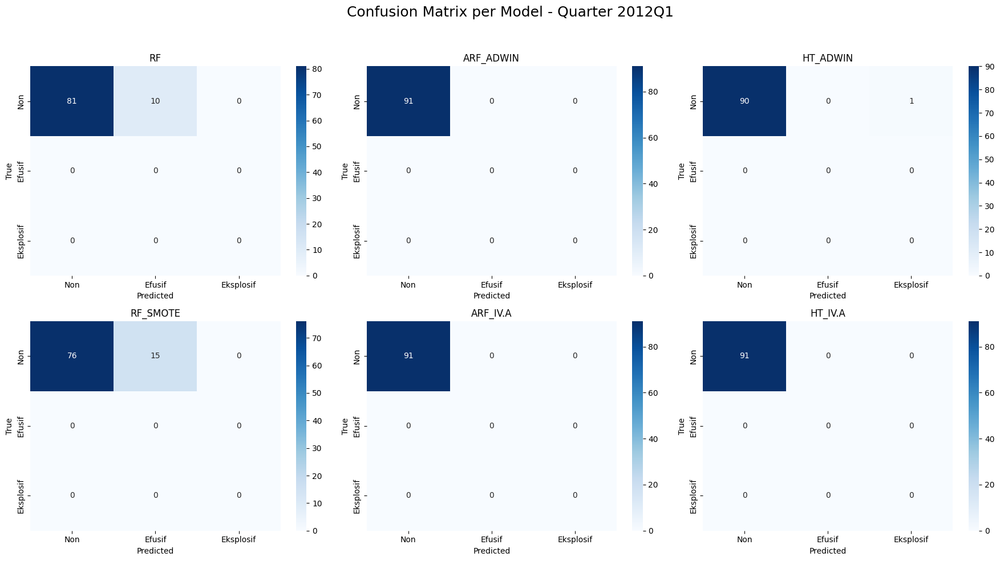

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2012Q1.png


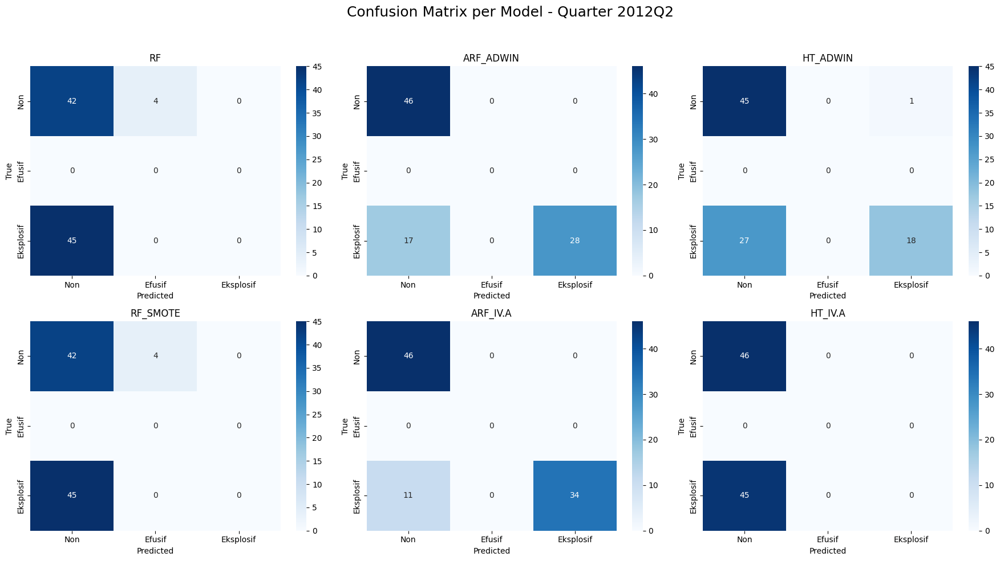

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2012Q2.png


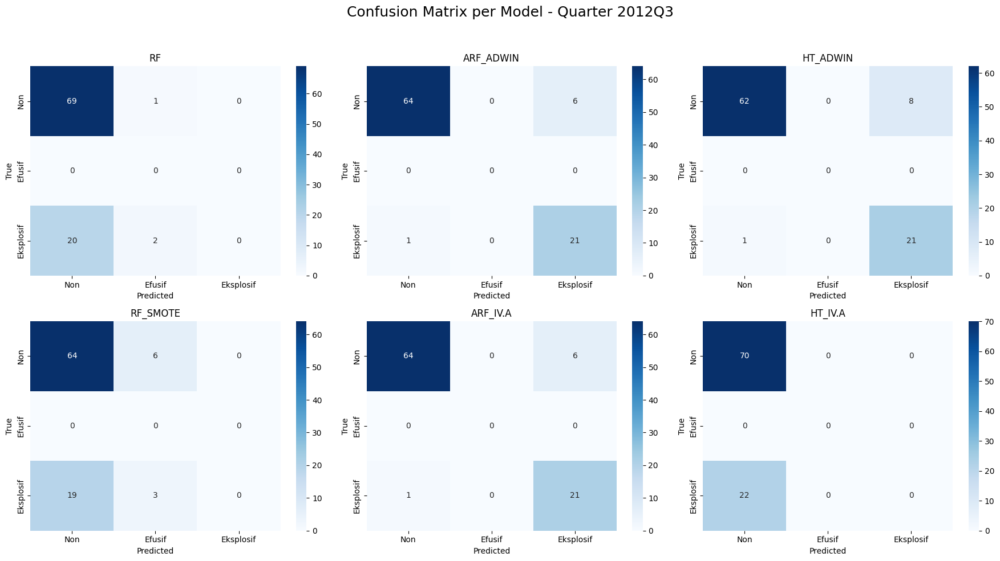

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2012Q3.png


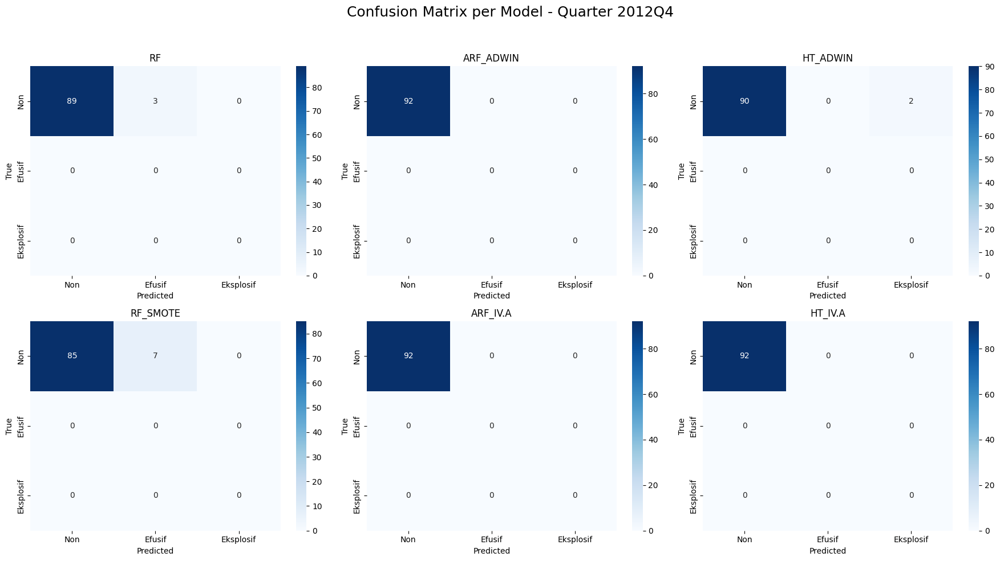

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2012Q4.png


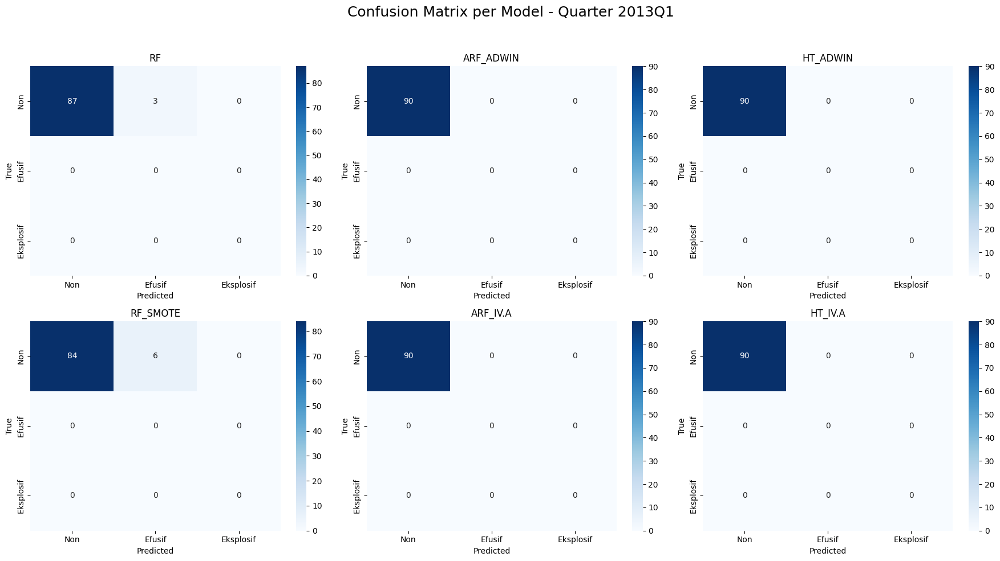

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2013Q1.png


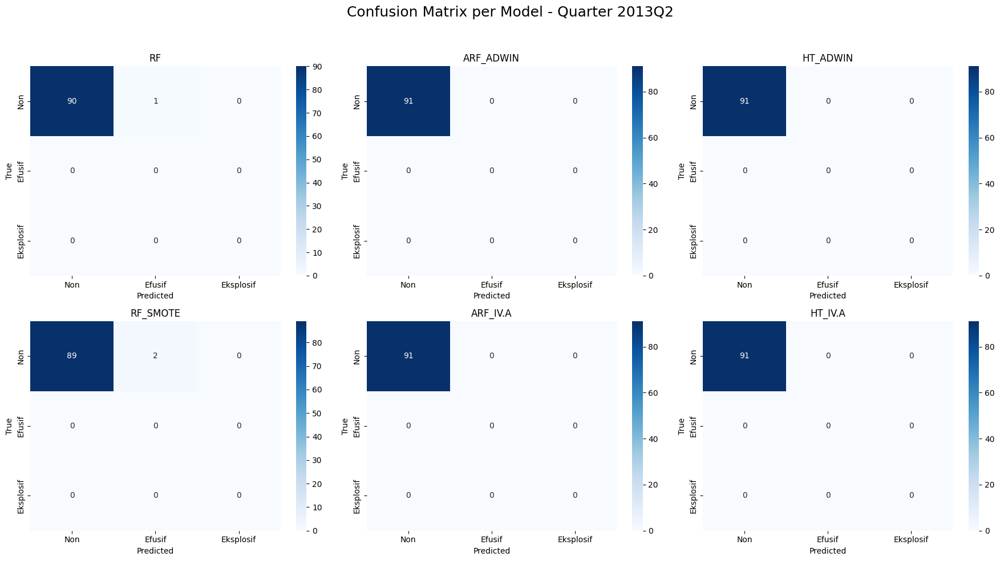

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2013Q2.png


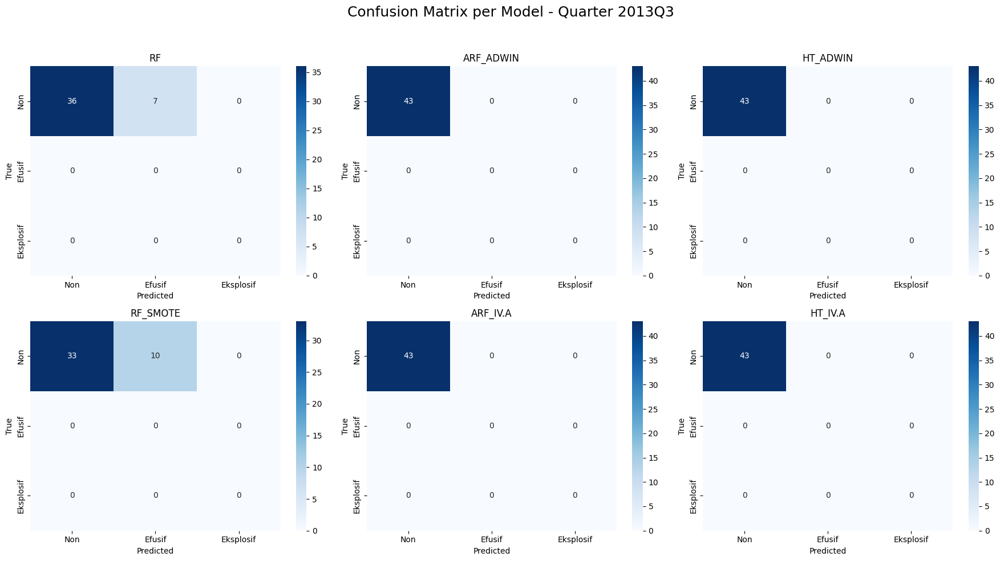

Saved and shown: confusion_matrices_per_quarter_b\confusion_matrix_2013Q3.png


In [27]:
import os  # Pastikan modul os telah diimpor

# Buat folder output jika belum ada
output_folder = 'confusion_matrices_per_quarter_b'
os.makedirs(output_folder, exist_ok=True)

# Loop untuk setiap periode (kuartal)
for period in periods:
    # Buat grid 2 baris x 3 kolom untuk pasangan model
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    quarter_data = eval_df[eval_df['Period'] == period]

    # Isi masing-masing subplot dengan confusion matrix
    for col in range(3):
        for row in range(2):
            model = models[col][row]
            ax = axes[row, col]
            cm = confusion_matrix(quarter_data['True'], quarter_data[model], labels=[0, 1, 2])
            sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                        xticklabels=labels, yticklabels=labels)
            ax.set_title(model)
            ax.set_xlabel('Predicted')
            ax.set_ylabel('True')

    # Tambahkan judul keseluruhan
    plt.suptitle(f'Confusion Matrix per Model - Quarter {period}', fontsize=18)
    plt.tight_layout(rect=[0, 0, 1, 0.95])

    # Simpan gambar ke file PNG dalam folder output
    filename = f'confusion_matrix_{period}.png'
    filepath = os.path.join(output_folder, filename)
    plt.savefig(filepath, dpi=300)  # Simpan dalam resolusi tinggi

    # Tampilkan hasil plot ke layar
    plt.show()

    # Tutup gambar untuk menghemat memori
    plt.close(fig)

    # Cetak konfirmasi bahwa gambar sudah disimpan
    print(f'Saved and shown: {filepath}')


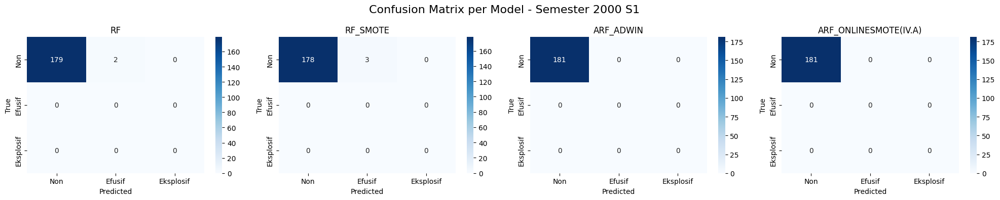

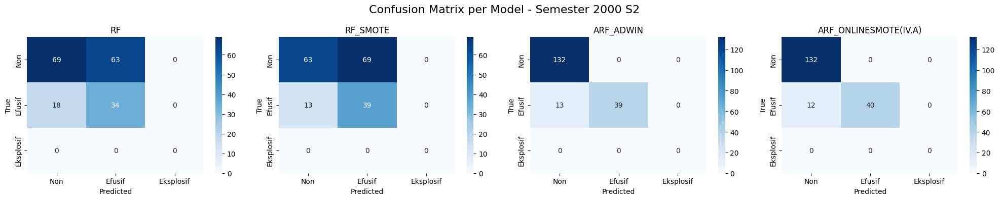

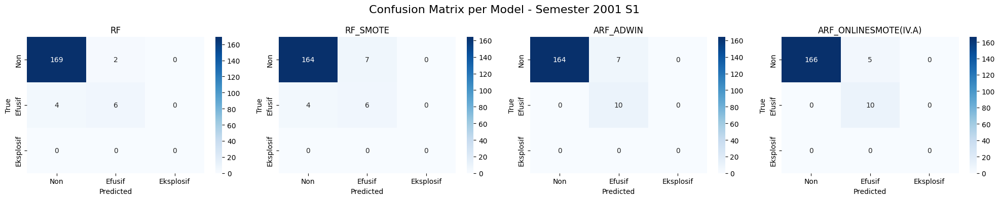

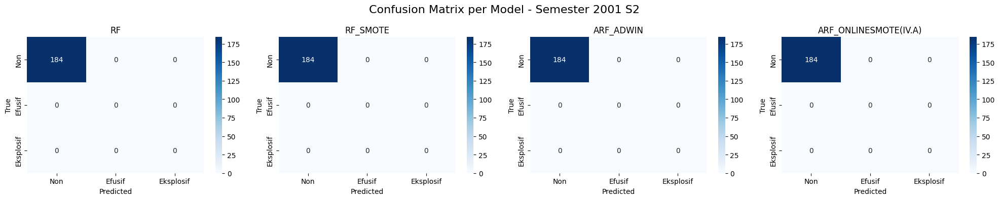

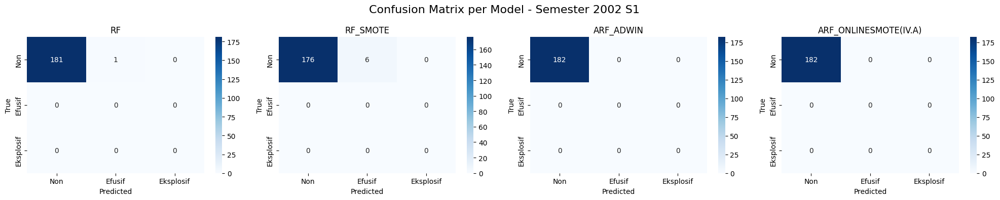

...

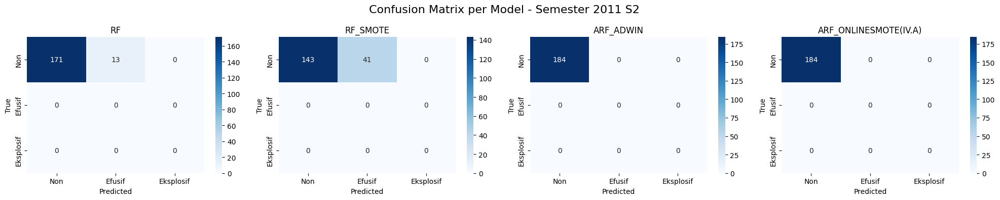

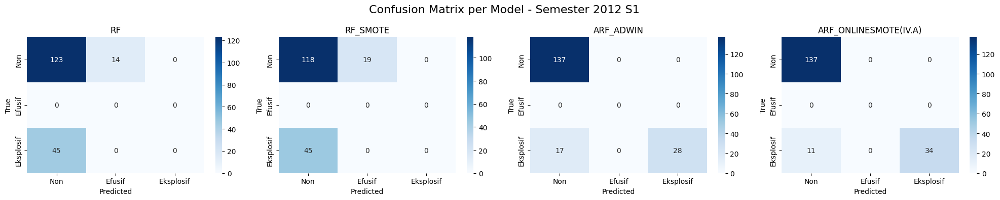

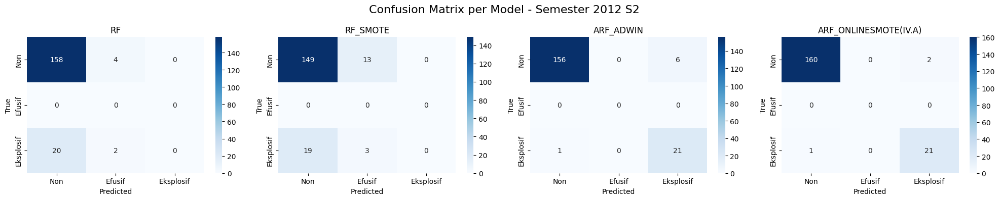

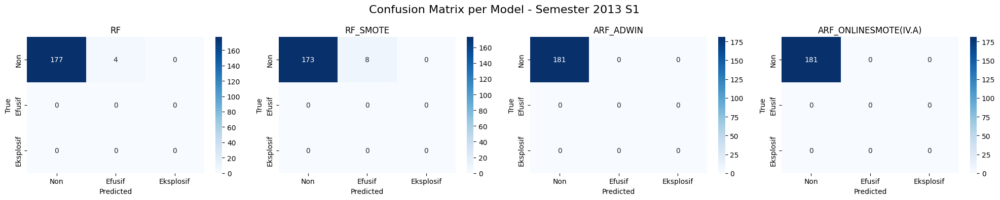

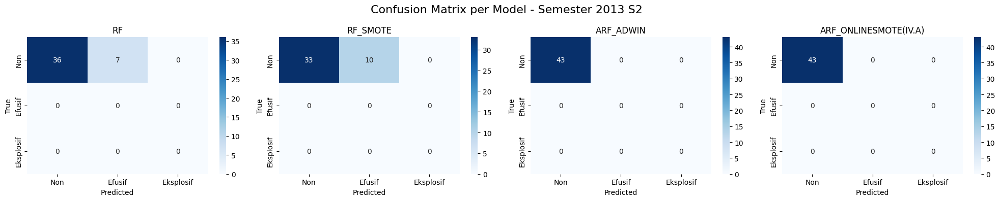

In [62]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Pastikan dataframe evaluasi tersedia
eval_df = pd.DataFrame({
    'Date': pd.to_datetime(dates_stream),
    'True': all_true,
    'RF': rf_pred,
    'RF_SMOTE': rf_smote_pred,
    'ARF_ADWIN': arf_adwin_pred,
    'ARF_ONLINESMOTE(IV.A)': arf_sel_pred
})

# Buat kolom semester
eval_df['Semester'] = eval_df['Date'].dt.year.astype(str) + ' S' + ((eval_df['Date'].dt.month - 1) // 6 + 1).astype(str)

# Buat confusion matrix per semester
semesters = sorted(eval_df[eval_df['Date'].dt.year >= 2000]['Semester'].unique())
models = ['RF', 'RF_SMOTE', 'ARF_ADWIN', 'ARF_ONLINESMOTE(IV.A)']
labels = ['Non', 'Efusif', 'Eksplosif']

# Plot 1x4 untuk setiap semester
for sem in semesters:
    fig, axes = plt.subplots(1, 4, figsize=(20, 4))
    sem_data = eval_df[eval_df['Semester'] == sem]

    for i, model in enumerate(models):
        cm = confusion_matrix(sem_data['True'], sem_data[model], labels=[0, 1, 2])
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i],
                    xticklabels=labels, yticklabels=labels)
        axes[i].set_title(f'{model}')
        axes[i].set_xlabel('Predicted')
        axes[i].set_ylabel('True')

    plt.suptitle(f'Confusion Matrix per Model - Semester {sem}', fontsize=16)
    plt.tight_layout()
    plt.show()


NameError: name 'adwin_drift_point' is not defined

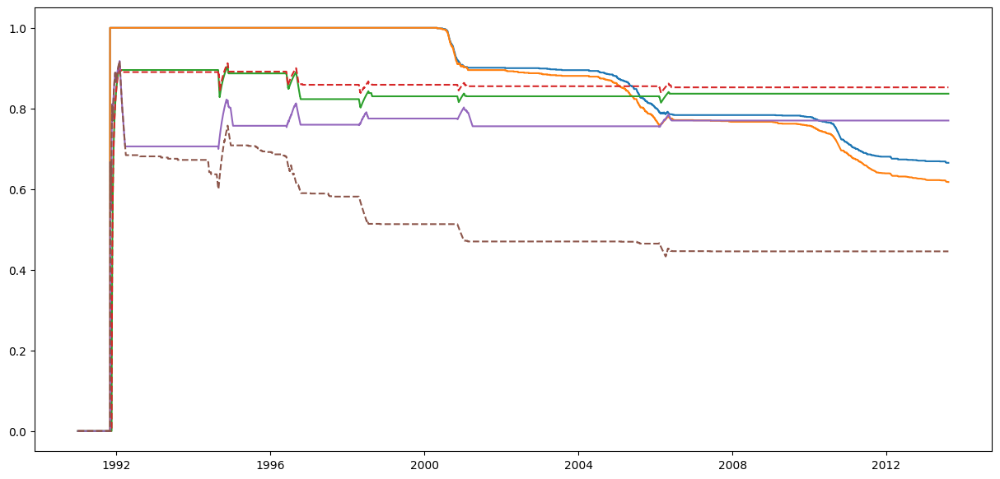

In [14]:
import datetime

# Ensure your dates are datetime objects; if not, convert them:
threshold_date = datetime.datetime.strptime('1999-12-31', '%Y-%m-%d')

plt.figure(figsize=(15,7))
plt.plot(dates_stream, cum_f1_rf, label='Static RF (train ≤ 2000)')
plt.plot(dates_stream, cum_f1_rf_smote, label='RF + SMOTE')
plt.plot(dates_stream, cum_f1_adwin, label='ARF + ADWIN')
plt.plot(dates_stream, cum_f1_iva, label='ARF IV.A (Online SMOTE)', linestyle='--')
plt.plot(dates_stream, cum_f1_ht_adwin, label='HT + ADWIN')
plt.plot(dates_stream, cum_f1_ht_iva, label='HT IV.A (Online SMOTE)', linestyle='--')

# Plot vertical lines for drift points
for dp in adwin_drift_point:
    if dates[dp] <= threshold_date:  # only mark drift lines within xlim range
        plt.axvline(x=dates[dp], color='red', linestyle=':', alpha=0.2)

plt.xlabel('Date')
plt.ylabel('Cumulative F1-Score')
plt.title('Cumulative F1-Score per Instance Over Time')
plt.ylim(0.75, 1.05)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
